In [254]:
pip freeze> requirements.txt

Note: you may need to restart the kernel to use updated packages.


## Initial Query Setup 

In [255]:
import requests
import pandas as pd
import warnings
import numpy as np
import matplotlib.pyplot as plt
import geopandas as gpd
warnings.filterwarnings('ignore')

In [256]:
# census_api_params = {
#     'US_CENSUS_API_KEY': '4173b62ab57a1515565edee0cd1b8dcc5d0b760e',
#     'host': 'https://api.census.gov/data',
#     'year': '/2022',
#     'dataset_acronym': '/acs/acs1',
#     'g': '?get=',
#     'usr_key': f"&key={'4173b62ab57a1515565edee0cd1b8dcc5d0b760e'}",
#     'location_states': '&for=state:*'
# }
census_api_params = {
    'US_CENSUS_API_KEY': '4173b62ab57a1515565edee0cd1b8dcc5d0b760e',
    'host': 'https://api.census.gov/data',
    'year': '/2022',
    'dataset_acronym': '/acs/acs1',
    'g': '?get=',
    'usr_key': f"&key={'4173b62ab57a1515565edee0cd1b8dcc5d0b760e'}",
    'location_states': '&for=congressional%20district:*'
}


In [257]:
variable_to_desc_map = {
    'NAME': 'Name',
    'B01001_001E': 'Total Population by Age and Sex',
    'B01001_026E': 'Total Female Population by Age',
    'B29001_001E': 'Total Voting-Age Citizens',
    'B29001_002E': 'Voting-Age Citizens, 18-29',
    'B29001_003E': 'Voting-Age Citizens, 30-44',
    'B29001_004E': 'Voting-Age Citizens, 45-64',
    'B29001_005E': 'Voting-Age Citizens, 65+',
    'B29002_002E': 'Less than 9th Grade',
    'B29002_003E': '9th-12th Grade, No Diploma',
    'B29002_004E': 'High School Graduate',
    'B29002_005E': 'Some College, No Degree',
    'B29002_006E': 'Associate’s Degree',
    'B29002_007E': 'Bachelor’s Degree',
    'B29002_008E': 'Graduate/Professional Degree',
    'B29003_002E': 'Income Below Poverty',
    'B29003_003E': 'Income Above Poverty',
    'B29004_001E': 'Median Household Income',
    'B05003_001E': 'Total by Sex, Age, Citizenship',
    'B05003_008E': 'Male Citizens, 18+',
    'B05003_009E': 'Male Citizens, 18+ Native',
    'B05003_011E': 'Male Citizens, 18+ Foreign-Born Citizen',
    'B05003_019E': 'Female Citizens, 18+',
    'B05003_020E': 'Female Citizens, 18+ Native',
    'B05003_022E': 'Female Citizens, 18+ Foreign-Born Citizen',
    'B27001_001E': 'Total Health Insurance Coverage',
    'B27001_004E': 'Insured Males, Under 6',
    'B27001_005E': 'Uninsured Males, Under 6',
    'B27001_006E': 'Males, 6-18',
    'B27001_007E': 'Insured Males, 6-18',
    'B27001_008E': 'Uninsured Males, 6-18',
    'B27002_001E': 'Total Private Health Insurance Coverage',
    'B27002_004E': 'Private Insured Males, Under 6',
    'B27002_005E': 'Private Uninsured Males, Under 6',
    'B27002_006E': 'Private Males, 6-18',
    'B27002_007E': 'Private Insured Males, 6-18',
    'B27002_008E': 'Private Uninsured Males, 6-18',
    'B05012_002E': 'Native Population',
    'B05012_003E': 'Foreign-Born Population',
    'B05003B_001E': 'Black Population by Sex, Age, Citizenship',
    'B05003C_001E': 'Native American Population by Sex, Age, Citizenship',
    'B05003D_001E': 'Asian Population by Sex, Age, Citizenship',
    'B16008_001E': 'Citizenship by Language & English Ability',
    'B16008_002E': 'Native Population by Language',
    'B16008_003E': 'Native Population, 5-17 Years',
    'B16008_004E': 'Native 5-17, English Only',
    'B19001_001E': 'Household Income (Adjusted)',
    'B19013_001E': 'Median Household Income (Adjusted)',
    'B19301_001E': 'Per Capita Income (Adjusted)',
    'B17001_001E': 'Poverty by Sex, Age',
    'B17001_002E': 'Below Poverty',
    'B17001_003E': 'Below Poverty, Male',
    'B02001_002E': 'White Alone',
    'B03002_003E': 'Non-Hispanic White',
    'B03002_004E': 'Non-Hispanic Black',
    'C17002_001E': 'Income to Poverty Ratio',
    'C17002_002E': 'Below 0.50 Poverty Line',
    'B01002_001E': 'Median Age',
    'B15003_001E': 'Educational Attainment, 25+',
    'C24050_001E': 'Employment by Industry',
    'C24050_002E': 'Employment in Agriculture',
    'C24050_003E': 'Employment in Construction',
    'C24050_004E': 'Employment in Manufacturing',
    'C24050_005E': 'Employment in Wholesale',
    'C24050_006E': 'Employment in Retail',
    'C24050_007E': 'Employment in Transport & Utilities',
    'C24050_008E': 'Employment in Information',
    'C24050_009E': 'Employment in Finance & Real Estate',
    'C24050_010E': 'Employment in Professional Services',
    'C24050_011E': 'Employment in Education & Health',
    'C24050_012E': 'Employment in Arts & Food',
    'C24050_013E': 'Employment in Other Services',
    'C24050_014E': 'Employment in Public Administration',
    'B25002_003E': 'Vacant Housing Units',
    'B25010_003E': 'Renter-Occupied Housing Units',
    'B25071_001E': 'Median Rent as % of Income',
}

print(len(variable_to_desc_map))

76


In [258]:
def fetch_voting_demographics_data(query_variables, census_api_params=census_api_params):
    US_CENSUS_API_KEY = census_api_params['US_CENSUS_API_KEY']
    host = census_api_params['host']
    year = census_api_params['year']
    dataset_acronym = census_api_params['dataset_acronym']
    g = census_api_params['g']
    location_states = census_api_params['location_states']
    usr_key = census_api_params['usr_key']
    
    # Define the variables for the query
    variables_voting_demographics = query_variables

    # Construct the query URL
    query_url_voting_demographics = f"{host}{year}{dataset_acronym}{g}{variables_voting_demographics}{location_states}{usr_key}"

    # Use requests package to call out to the API
    response_voting_demographics = requests.get(query_url_voting_demographics)

    # Convert the response to JSON
    data_voting_demographics = response_voting_demographics.json()

    # Create a dataframe from the JSON data
    columns_voting_demographics = data_voting_demographics[0]
    data_voting_demographics = data_voting_demographics[1:]
    df_voting_demographics = pd.DataFrame(data_voting_demographics, columns=columns_voting_demographics)


    # BEGIN: drop the last column
    df_voting_demographics = df_voting_demographics.iloc[:, :-1]
    # END: drop the last column

    return df_voting_demographics

# Example usage:
# Define the variables for the query
query_variables = 'NAME,B01001_001E,B01001_026E,B01002_001E,B15003_001E,C24050_001E,B19013_001E,B02001_001E,B17001_002E,C24050_002E,C24050_003E,C24050_004E,C24050_005E,C24050_006E,C24050_007E,C24050_008E,C24050_009E,C24050_010E,C24050_011E,C24050_012E,C24050_013E,C24050_014E'
df_district = fetch_voting_demographics_data(query_variables, census_api_params)

In [259]:
query_variables = ','.join(variable_to_desc_map.keys())

def process_voting_demographics_data(variable_to_desc_map, census_api_params):
    # Split the variables into chunks of 50
    variable_chunks = [list(variable_to_desc_map.keys())[i:i + 50] for i in range(0, len(variable_to_desc_map), 50)]

    # Initialize an empty dataframe
    df_district = pd.DataFrame()

    # Fetch data for each chunk and concatenate the results
    for chunk in variable_chunks:
        query_variables = ','.join(chunk)
        df_chunk = fetch_voting_demographics_data(query_variables, census_api_params)
        if df_district.empty:
            df_district = df_chunk
        else:
            df_district = pd.concat([df_district, df_chunk.iloc[:, 1:]], axis=1)

    df_district.rename(columns=variable_to_desc_map, inplace=True)
    return df_district

# Example usage:
df_district = process_voting_demographics_data(variable_to_desc_map, census_api_params)
# Display the combined dataframe
df_district.head()

,Name,Total Population by Age and Sex,Total Female Population by Age,Total Voting-Age Citizens,"Voting-Age Citizens, 18-29","Voting-Age Citizens, 30-44","Voting-Age Citizens, 45-64","Voting-Age Citizens, 65+",Less than 9th Grade,"9th-12th Grade, No Diploma",...,Employment in Finance & Real Estate,Employment in Professional Services,Employment in Education & Health,Employment in Arts & Food,Employment in Other Services,Employment in Public Administration,Vacant Housing Units,Renter-Occupied Housing Units,Median Rent as % of Income,state
0,"Congressional District 1 (118th Congress), Ala...",730935,376261,560099,102653,132021,185192,140233,11997,43369,...,19104,32007,70525,29506,16194,13445,64946,2.18,33.3,01
1,"Congressional District 2 (118th Congress), Ala...",723094,372589,545657,102347,138444,175149,129717,16414,46568,...,18259,28709,67009,26261,10704,28760,48925,2.36,27.7,01
2,"Congressional District 3 (118th Congress), Ala...",723164,371970,560621,122144,128196,179120,131161,16139,50777,...,17621,26971,74189,27462,16298,16589,47202,2.27,29.0,01
3,"Congressional District 4 (118th Congress), Ala...",727607,372781,547069,100430,129490,180781,136368,21196,56294,...,13143,26043,69059,26232,16775,13661,47055,2.27,27.4,01
4,"Congressional District 5 (118th Congress), Ala...",743238,376062,565941,110702,135764,192541,126934,14593,37205,...,16177,58618,63946,25549,17117,27230,27560,2.18,26.2,01


In [260]:
print(f"Number of rows in df_district: {df_district.shape[0]}")
print(f"Number of columns in df_district: {df_district.shape[1]}")

Number of rows in df_district: 437
Number of columns in df_district: 77


In [261]:
ny15_data = df_district[df_district['Name'].str.contains('New York', na=False)]
display(ny15_data.head())

,Name,Total Population by Age and Sex,Total Female Population by Age,Total Voting-Age Citizens,"Voting-Age Citizens, 18-29","Voting-Age Citizens, 30-44","Voting-Age Citizens, 45-64","Voting-Age Citizens, 65+",Less than 9th Grade,"9th-12th Grade, No Diploma",...,Employment in Finance & Real Estate,Employment in Professional Services,Employment in Education & Health,Employment in Arts & Food,Employment in Other Services,Employment in Public Administration,Vacant Housing Units,Renter-Occupied Housing Units,Median Rent as % of Income,state
258,"Congressional District 1 (118th Congress), New...",775158,394587,583063,104297,116919,207724,154123,13182,18484,...,31814,52929,112971,32246,17269,19987,50879,2.40,35.9,36
259,"Congressional District 2 (118th Congress), New...",775081,385310,555178,113990,126946,195468,118774,18583,24007,...,25676,50492,107218,31762,17442,21673,18437,2.64,36.5,36
260,"Congressional District 3 (118th Congress), New...",771208,395271,565585,95470,114208,198634,157273,17801,20544,...,44726,56309,117038,24360,16215,15872,13310,2.31,30.9,36
261,"Congressional District 4 (118th Congress), New...",771912,391025,552505,104654,130488,182654,134709,21015,20452,...,31669,47924,128602,28621,14122,19726,12513,2.70,32.9,36
262,"Congressional District 5 (118th Congress), New...",751997,390297,509037,103606,111106,176374,117951,31162,37758,...,23533,35175,110692,23297,16539,22826,15512,2.58,32.5,36


In [262]:
ny15_data['Voter Turnout'] = ny15_data['Total Voting-Age Citizens'].astype(float) / ny15_data['Total Population by Age and Sex'].astype(float)
ny15_data['Voter Turnout'].head()
ny15_data['Voter Turnout'][ny15_data['Name'].str.contains('District 15')].values[0]

np.float64(0.6187723220727251)

## Block / County data

In [263]:
census_api_params = {
    'US_CENSUS_API_KEY': '4173b62ab57a1515565edee0cd1b8dcc5d0b760e',
    'host': 'https://api.census.gov/data',
    'year': '/2020',
    'dataset_acronym': '/acs/acs5',  # Note: acs5 includes block group data, whereas acs1 does not.
    'g': '?get=',
    'usr_key': f"&key={'4173b62ab57a1515565edee0cd1b8dcc5d0b760e'}",
    'location_states': '&for=block%20group:*&in=state:36%20county:*'
}
# &for=block%20group:*&in=state:06%20county:073
# https://api.census.gov/data/2022/acs/acs5?get=NAME,B01001_001E&for=block%20group:*&in=state:06%20county:073&key=YOUR_KEY_GOES_HERE
# process_voting_demographics_data(variable_to_desc_map, census_api_params)
# query_variables = 'NAME,B01001_001E'

df_block = process_voting_demographics_data(variable_to_desc_map, census_api_params)

### Dealing with missing data

In [264]:
# Remove columns with all NaN values
df_block = df_block.dropna(axis=1, how='all')
# Remove duplicate columns
df_block = df_block.loc[:, ~df_block.columns.duplicated()]
# Display the cleaned DataFrame
ny_blocks = df_block[df_block['Name'].str.contains('New York', na=False)]
display(ny_blocks.head())

,Name,Total Population by Age and Sex,Total Female Population by Age,Total Voting-Age Citizens,"Voting-Age Citizens, 18-29","Voting-Age Citizens, 30-44","Voting-Age Citizens, 45-64","Voting-Age Citizens, 65+",Less than 9th Grade,"9th-12th Grade, No Diploma",...,White Alone,Non-Hispanic White,Non-Hispanic Black,Income to Poverty Ratio,Below 0.50 Poverty Line,Median Age,"Educational Attainment, 25+",Vacant Housing Units,Renter-Occupied Housing Units,Median Rent as % of Income
0,"Block Group 5, Census Tract 128, Broome County...",523,275,437,50,105,148,134,18,0,...,391,368,0,523,14,49.6,423,0,2.32,-666666666.0
1,"Block Group 2, Census Tract 130, Broome County...",424,222,262,44,63,107,48,16,14,...,305,286,92,408,16,49.2,282,75,1.90,51.0
2,"Block Group 1, Census Tract 131, Broome County...",465,195,366,40,55,162,109,0,45,...,465,465,0,465,37,48.1,326,0,-666666666.00,51.0
3,"Block Group 1, Census Tract 132.01, Broome Cou...",740,447,632,91,49,225,267,0,8,...,666,666,0,740,10,57.7,603,28,1.24,24.4
4,"Block Group 2, Census Tract 132.02, Broome Cou...",1235,593,1014,60,210,332,412,10,53,...,1143,1143,0,1235,1,53.3,986,38,1.27,23.9


In [265]:
ny_blocks.head().to_excel('ny_blocks.xlsx', index=False)

### Visualization & Cleaning 

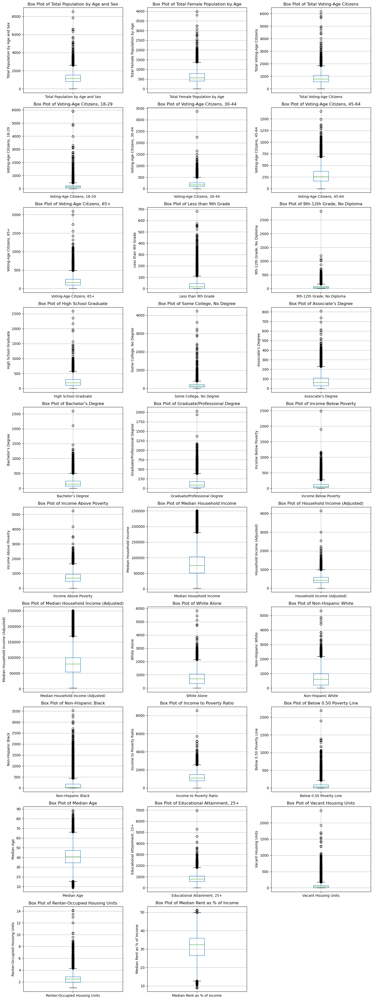

In [277]:
# List of variables to plot
variables_to_plot = [
    'Total Population by Age and Sex', 'Total Female Population by Age', 'Total Voting-Age Citizens',
    'Voting-Age Citizens, 18-29', 'Voting-Age Citizens, 30-44', 'Voting-Age Citizens, 45-64',
    'Voting-Age Citizens, 65+', 'Less than 9th Grade',
    '9th-12th Grade, No Diploma', 'High School Graduate', 'Some College, No Degree', 'Associate’s Degree',
    'Bachelor’s Degree', 'Graduate/Professional Degree',
    'Income Below Poverty', 'Income Above Poverty', 'Median Household Income', 'Household Income (Adjusted)',
    'Median Household Income (Adjusted)', 'White Alone', 'Non-Hispanic White',
    'Non-Hispanic Black', 'Income to Poverty Ratio', 'Below 0.50 Poverty Line', 'Median Age',
    'Educational Attainment, 25+', 'Vacant Housing Units',	'Renter-Occupied Housing Units',	'Median Rent as % of Income'
]

# Convert columns to numeric, errors='coerce' will replace non-numeric values with NaN
ny_blocks[variables_to_plot] = ny_blocks[variables_to_plot].apply(pd.to_numeric, errors='coerce')

def plot_box_plots(df, variables_to_plot):
    # Convert columns to numeric, errors='coerce' will replace non-numeric values with NaN
    df[variables_to_plot] = df[variables_to_plot].apply(pd.to_numeric, errors='coerce')
    # Calculate the number of required rows for the subplot grid
    num_rows = (len(variables_to_plot) + 2) // 3
    # Plot box plots for each variable in a subplot grid
    fig, axes = plt.subplots(nrows=num_rows, ncols=3, figsize=(15, 40))
    axes = axes.flatten()

    for i, variable in enumerate(variables_to_plot):
        df.boxplot(column=variable, ax=axes[i])
        axes[i].set_title(f'Box Plot of {variable}')
        axes[i].set_ylabel(variable)
        axes[i].grid(True)

    # Remove any empty subplots
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])

    plt.tight_layout()
    plt.show()

plt.rcParams.update({'font.size': 10})

# Test the function
plot_box_plots(ny_blocks, variables_to_plot)

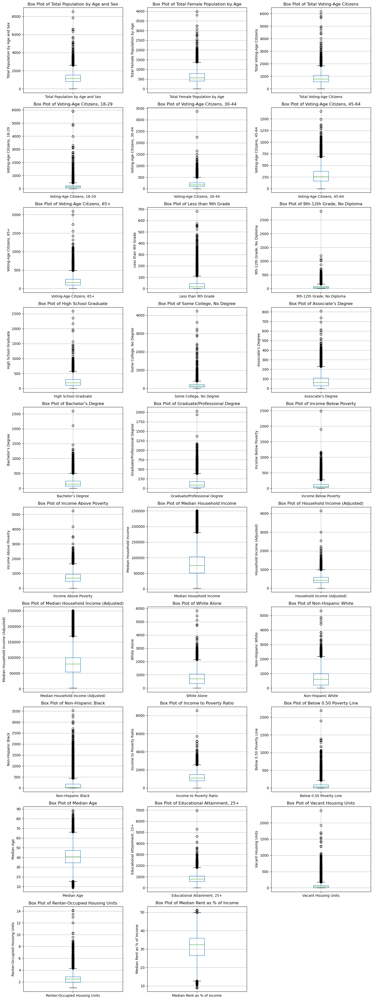

In [278]:
# Function to replace negative values with the mean of the column
def replace_negatives_with_mean(df):
    for col in df.columns:
        if df[col].dtype in ['int64', 'float64']:
            mean_value = df[df[col] >= 0][col].mean()
            df[col] = df[col].apply(lambda x: mean_value if x < 0 else x)
    return df

# Apply the function to the DataFrame
ny_blocks = replace_negatives_with_mean(ny_blocks)

# Replot the box plots for each variable in a subplot grid
plot_box_plots(ny_blocks, variables_to_plot)

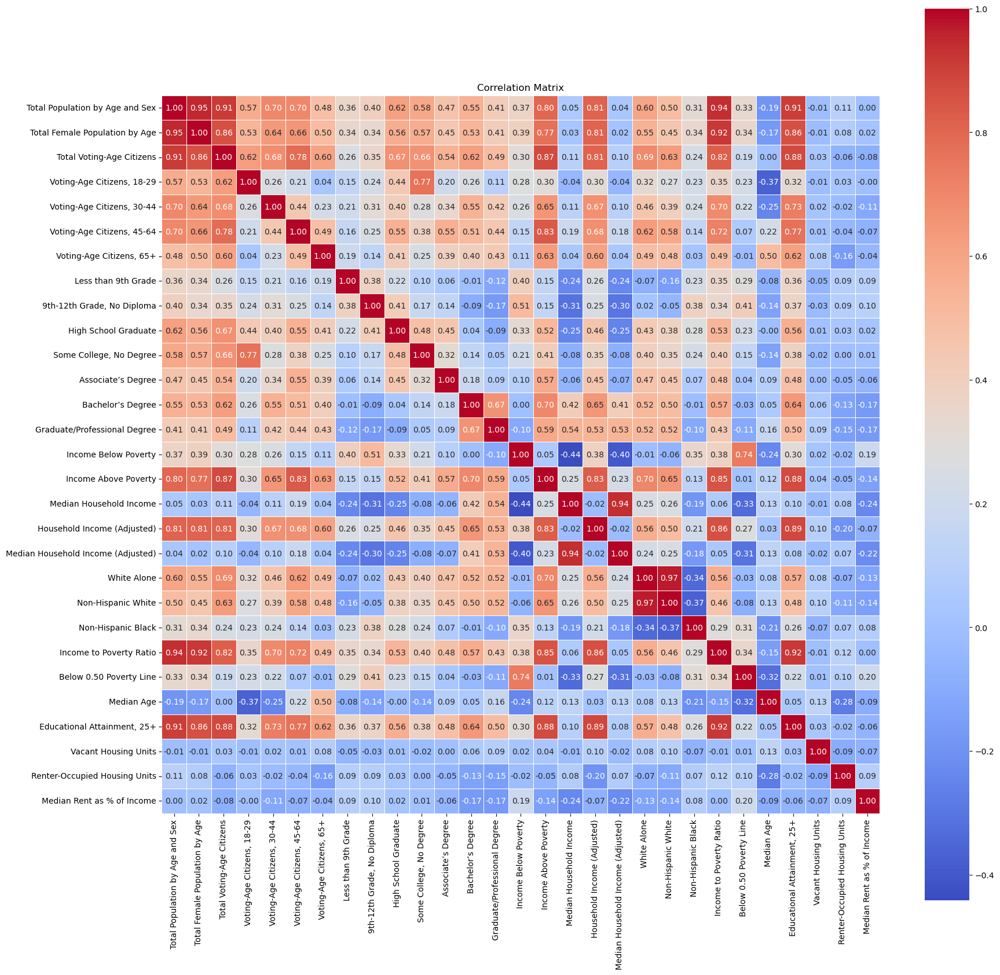

In [279]:
import seaborn as sns

import matplotlib.pyplot as plt

def plot_correlation_matrix(df, variables_to_plot, title='Correlation Matrix'):
    # Calculate the correlation matrix for the specified variables
    corr = df[variables_to_plot].corr()

    # Set up the matplotlib figure
    plt.figure(figsize=(20, 20))

    # Draw the heatmap with the mask and correct aspect ratio
    sns.heatmap(corr, annot=True, fmt=".2f", cmap='coolwarm', square=True, linewidths=.5)

    # Set the title
    plt.title(title)

    # Show the plot
    plt.show()

# Example usage:
plot_correlation_matrix(ny_blocks, variables_to_plot)

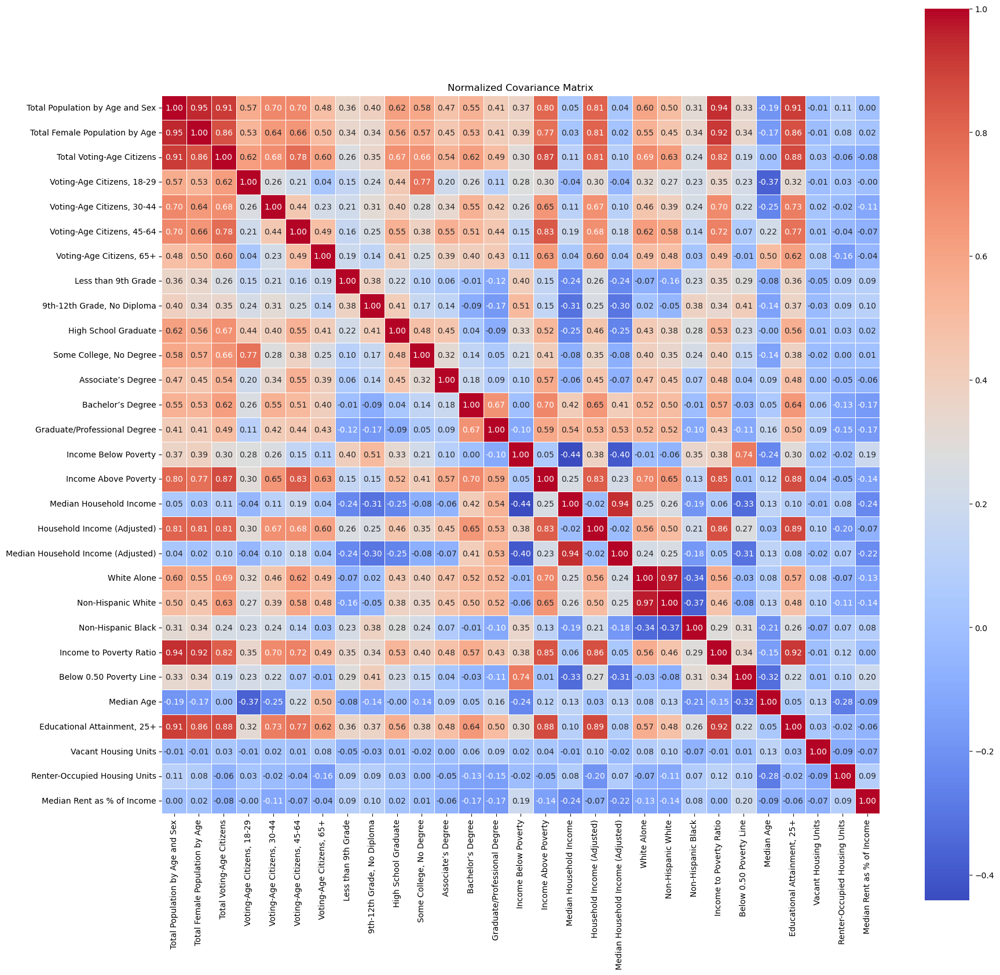

In [280]:
import seaborn as sns

import matplotlib.pyplot as plt

def plot_covariance_matrix(df, variables_to_plot, title='Normalized Covariance Matrix'):
    # Calculate the covariance matrix for the specified variables
    cov = df[variables_to_plot].cov()

    # Normalize the covariance matrix
    std_dev = np.sqrt(np.diag(cov))
    cov_normalized = cov / np.outer(std_dev, std_dev)

    # Set up the matplotlib figure
    plt.figure(figsize=(20, 20))

    # Draw the heatmap with the mask and correct aspect ratio
    sns.heatmap(cov_normalized, annot=True, fmt=".2f", cmap='coolwarm', square=True, linewidths=.5)

    # Set the title
    plt.title(title)

    # Show the plot
    plt.show()

# Example usage:
plot_covariance_matrix(ny_blocks, variables_to_plot)

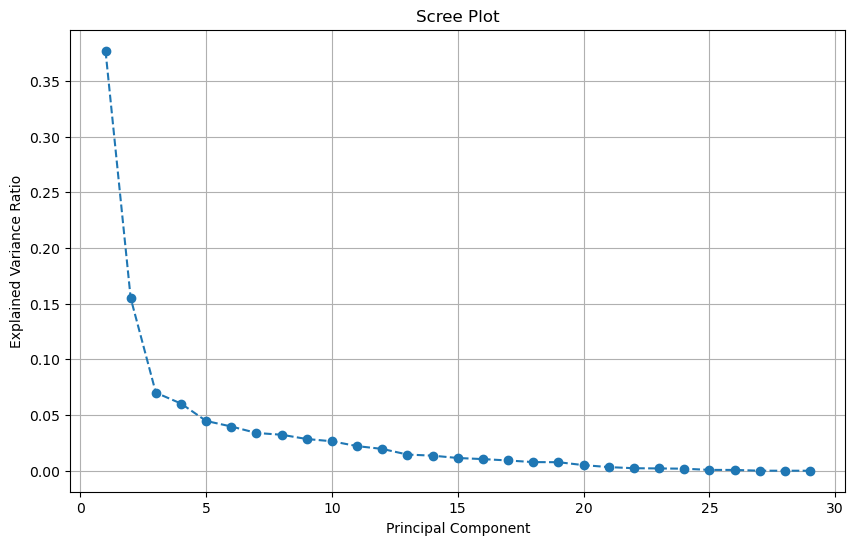

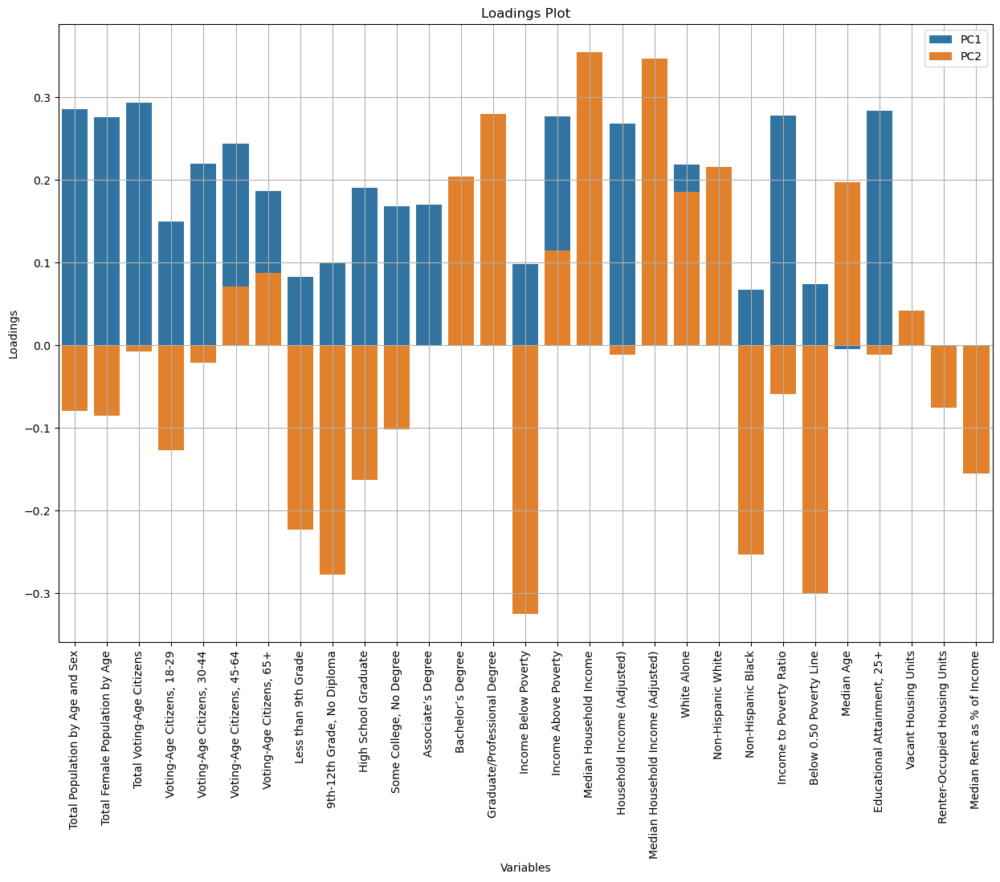

In [281]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# Select the variables for PCA
variables_for_pca = variables_to_plot
# Standardize the data
scaler = StandardScaler()
ny_blocks_scaled = scaler.fit_transform(ny_blocks[variables_for_pca])

# Perform PCA
pca = PCA(n_components=len(variables_for_pca))
ny_blocks_pca = pca.fit_transform(ny_blocks_scaled)

# Explained variance ratio
explained_variance_ratio = pca.explained_variance_ratio_

# Create a DataFrame for the PCA components
pca_columns = [f'PC{i+1}' for i in range(pca.n_components_)]
ny_blocks_pca_df = pd.DataFrame(ny_blocks_pca, columns=pca_columns)
ny_blocks_pca_df['Name'] = ny_blocks['Name']

# Create a DataFrame for loadings
loadings_df = pd.DataFrame(pca.components_.T, columns=pca_columns, index=variables_for_pca).reset_index()
loadings_df.rename(columns={'index': 'Variable'}, inplace=True)

# Scree plot to show the explained variance by each principal component
def plot_scree(explained_variance_ratio):
    plt.figure(figsize=(10, 6))
    plt.plot(range(1, len(explained_variance_ratio) + 1), explained_variance_ratio, marker='o', linestyle='--')
    plt.title('Scree Plot')
    plt.xlabel('Principal Component')
    plt.ylabel('Explained Variance Ratio')
    plt.grid(True)
    plt.show()

# Loading plot to show the contribution of each variable to the principal components
def plot_loadings(loadings_df, num_components=2):
    plt.figure(figsize=(15, 10))
    for i in range(num_components):
        component = f'PC{i+1}'
        sns.barplot(x='Variable', y=component, data=loadings_df, label=component)
    plt.title('Loadings Plot')
    plt.xlabel('Variables')
    plt.ylabel('Loadings')
    plt.xticks(rotation=90)
    plt.legend()
    plt.grid(True)
    plt.show()

# Plot the scree plot
plot_scree(explained_variance_ratio)

# Plot the loadings plot
plot_loadings(loadings_df)


In [282]:
pca.explained_variance_ratio_[:15].sum()

np.float64(0.9490987211875349)

Top 10 most influential variables based on loadings from the first three principal components:
['Total Population by Age and Sex', 'Income Above Poverty', 'Total Female Population by Age', 'Income to Poverty Ratio', 'White Alone', 'Non-Hispanic White', 'Bachelor’s Degree', 'Graduate/Professional Degree', 'Total Voting-Age Citizens', 'High School Graduate', 'Voting-Age Citizens, 45-64', 'Educational Attainment, 25+', 'Voting-Age Citizens, 65+', 'Household Income (Adjusted)', 'Voting-Age Citizens, 30-44', 'Median Household Income', 'Voting-Age Citizens, 18-29', 'Median Household Income (Adjusted)', 'Income Below Poverty', '9th-12th Grade, No Diploma', 'Below 0.50 Poverty Line', 'Associate’s Degree', 'Some College, No Degree', 'Non-Hispanic Black', 'Less than 9th Grade']


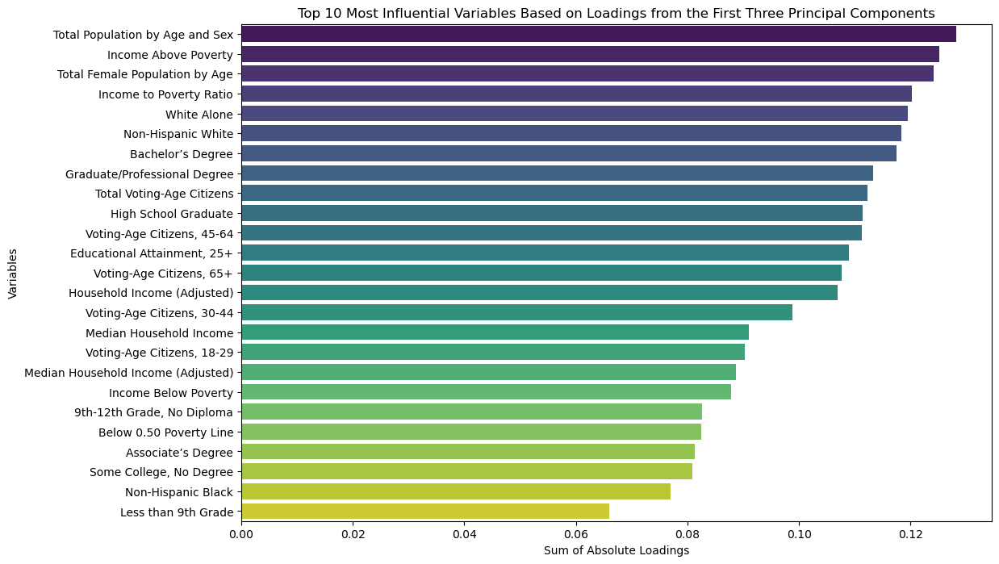

In [283]:
# Calculate the absolute values of the loadings for the first three principal components
abs_loadings = loadings_df.iloc[:, 1:4].abs()

# Scale the sum by explained variance ratio
explained_variance_ratio = pca.explained_variance_ratio_[:3]
scaled_abs_loadings = abs_loadings * explained_variance_ratio

# Sum the scaled absolute loadings for each variable
sum_abs_loadings = scaled_abs_loadings.sum(axis=1)

# Select the top 10 variables with the highest sum of absolute loadings
top_10_variables = sum_abs_loadings.nlargest(25).index

# Get the names of the top 10 variables
top_10_variable_names = loadings_df.loc[top_10_variables, 'Variable'].tolist()

print("Top 10 most influential variables based on loadings from the first three principal components:")
print(top_10_variable_names)

# Plot the top 10 most influential variables based on loadings
plt.figure(figsize=(12, 8))
sns.barplot(x=sum_abs_loadings[top_10_variables], y=top_10_variable_names, palette="viridis")
plt.title("Top 10 Most Influential Variables Based on Loadings from the First Three Principal Components")
plt.xlabel("Sum of Absolute Loadings")
plt.ylabel("Variables")
plt.show()

[0.37708756 0.15500601 0.07007695 0.06032143 0.04468438 0.03969621
 0.03388939 0.03230119 0.02846204 0.02644026 0.02208886 0.01957345
 0.01450749 0.01353234 0.01143117]
Top 10 most influential variables based on loadings and scree plot:
['Bachelor’s Degree', 'Non-Hispanic White', 'White Alone', 'High School Graduate', 'Voting-Age Citizens, 65+']


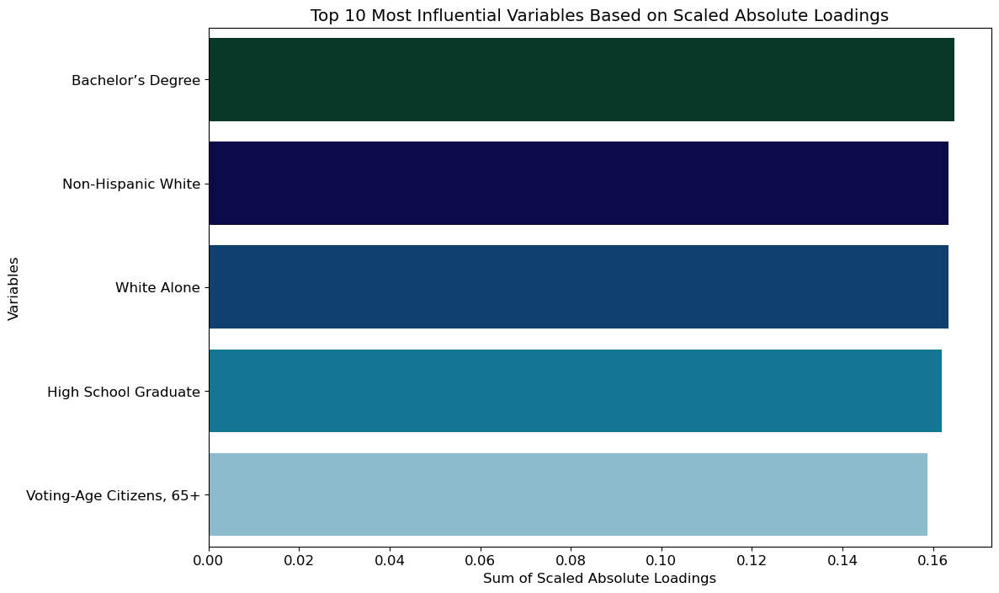

In [284]:
# Calculate the absolute values of the loadings for the first few principal components
abs_loadings = loadings_df.iloc[:, 1:16].abs()

# Scale the sum by explained variance ratio
explained_variance_ratio = pca.explained_variance_ratio_[:15]
print(explained_variance_ratio)

scaled_abs_loadings = abs_loadings * explained_variance_ratio

# Sum the absolute loadings for each variable
sum_abs_loadings = scaled_abs_loadings.sum(axis=1)

# Select the top 10 variables with the highest sum of absolute loadings
top_10_variables = sum_abs_loadings.nlargest(5).index

# Get the names of the top 10 variables
top_10_variable_names = loadings_df.loc[top_10_variables, 'Variable'].tolist()
plt.rcParams['font.size'] = 12
print("Top 10 most influential variables based on loadings and scree plot:")
print(top_10_variable_names)
# Plot the scaled absolute loadings for the top 10 variables
plt.figure(figsize=(12, 8))
sns.barplot(x=sum_abs_loadings[top_10_variables], y=top_10_variable_names, palette="ocean")
plt.title("Top 10 Most Influential Variables Based on Scaled Absolute Loadings")
plt.xlabel("Sum of Scaled Absolute Loadings")
plt.ylabel("Variables")
plt.show()

Based on the PCA Analysis we can see which variable capture the most variation amongst the blocks in New York District.
However, this cannot necessarity be used to explain voter behaviour variables describing most variation may not have similar influence on actual party will in the precinct 
or voter turnout. However, we can glean from this that blocks in NY vary most along Education , Ethinicity and voting age population age groups and Income Level.

Highly correlated pairs:
('Total Population by Age and Sex', 'Total Female Population by Age')
('Total Population by Age and Sex', 'Total Voting-Age Citizens')
('Total Population by Age and Sex', 'Household Income (Adjusted)')
('Total Population by Age and Sex', 'Income to Poverty Ratio')
('Total Population by Age and Sex', 'Educational Attainment, 25+')
('Total Female Population by Age', 'Total Voting-Age Citizens')
('Total Female Population by Age', 'Household Income (Adjusted)')
('Total Female Population by Age', 'Income to Poverty Ratio')
('Total Female Population by Age', 'Educational Attainment, 25+')
('Total Voting-Age Citizens', 'Income Above Poverty')
('Total Voting-Age Citizens', 'Household Income (Adjusted)')
('Total Voting-Age Citizens', 'Income to Poverty Ratio')
('Total Voting-Age Citizens', 'Educational Attainment, 25+')
('Voting-Age Citizens, 45-64', 'Income Above Poverty')
('Income Above Poverty', 'Household Income (Adjusted)')
('Income Above Poverty', 'Income to Pover

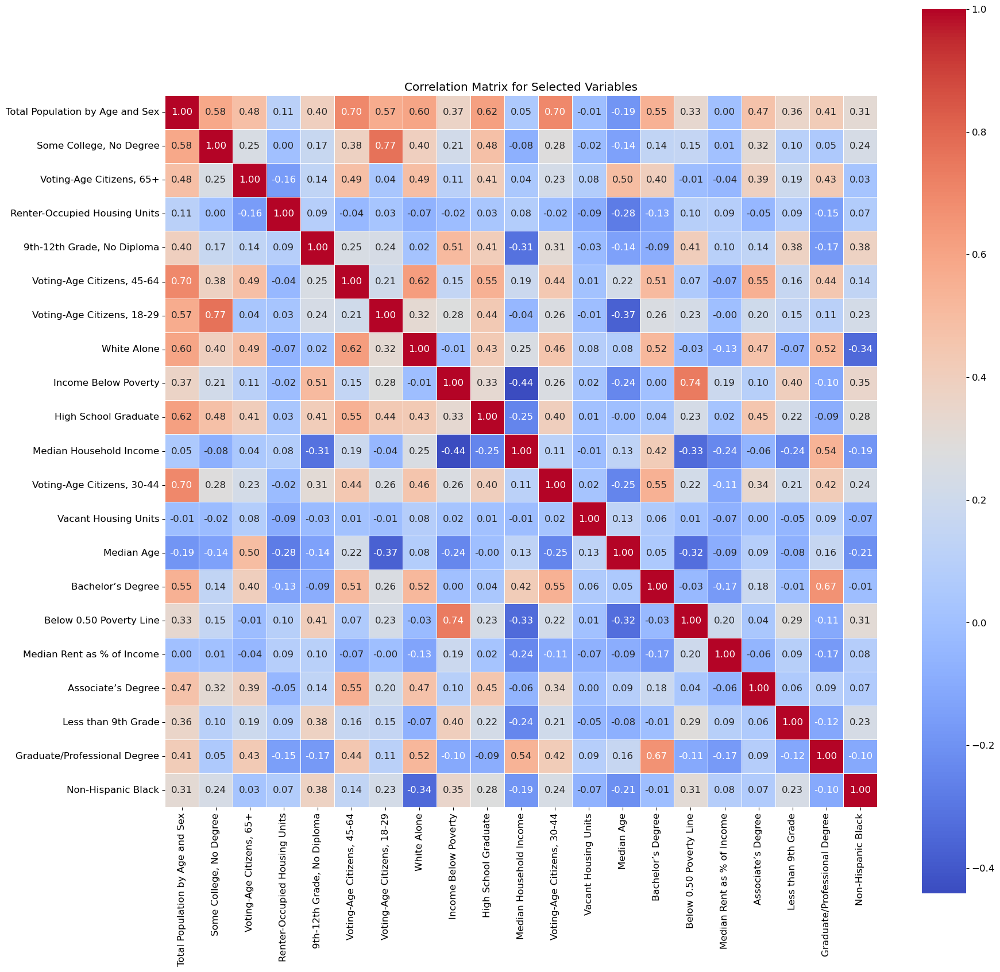

In [285]:
import numpy as np

# Calculate the correlation matrix for the specified variables
correlation_matrix = ny_blocks[variables_to_plot].corr().abs()

# Set a threshold for high correlation
threshold = 0.8

# Create a boolean mask to identify highly correlated pairs
high_corr_var = np.where(correlation_matrix > threshold)
high_corr_pairs = [(correlation_matrix.index[x], correlation_matrix.columns[y]) for x, y in zip(*high_corr_var) if x != y and x < y]

# Print highly correlated pairs
print("Highly correlated pairs:")
for pair in high_corr_pairs:
    print(pair)

# Select independent variables by keeping one variable from each pair of highly correlated variables
selected_variables = set(correlation_matrix.columns)
for var1, var2 in high_corr_pairs:
    if var2 in selected_variables:
        selected_variables.remove(var2)

# Convert the set to a list
selected_variables = list(selected_variables)

print("\nSelected independent variables:")
print(selected_variables)
# Plot the correlation matrix for the selected variables
plot_correlation_matrix(ny_blocks, selected_variables, title='Correlation Matrix for Selected Variables')

### Process for Mappting using GEOID

In [286]:
# Extract Block Group from the Name column and create a new column
ny_blocks['Block Group'] = ny_blocks['Name'].str.extract(r'Block Group (\d+)')
# Display the updated dataframe
display(ny_blocks.head())

,Name,Total Population by Age and Sex,Total Female Population by Age,Total Voting-Age Citizens,"Voting-Age Citizens, 18-29","Voting-Age Citizens, 30-44","Voting-Age Citizens, 45-64","Voting-Age Citizens, 65+",Less than 9th Grade,"9th-12th Grade, No Diploma",...,Non-Hispanic White,Non-Hispanic Black,Income to Poverty Ratio,Below 0.50 Poverty Line,Median Age,"Educational Attainment, 25+",Vacant Housing Units,Renter-Occupied Housing Units,Median Rent as % of Income,Block Group
0,"Block Group 5, Census Tract 128, Broome County...",523,275,437,50,105,148,134,18,0,...,368,0,523,14,49.6,423,0,2.320000,32.370218,5
1,"Block Group 2, Census Tract 130, Broome County...",424,222,262,44,63,107,48,16,14,...,286,92,408,16,49.2,282,75,1.900000,51.000000,2
2,"Block Group 1, Census Tract 131, Broome County...",465,195,366,40,55,162,109,0,45,...,465,0,465,37,48.1,326,0,2.540555,51.000000,1
3,"Block Group 1, Census Tract 132.01, Broome Cou...",740,447,632,91,49,225,267,0,8,...,666,0,740,10,57.7,603,28,1.240000,24.400000,1
4,"Block Group 2, Census Tract 132.02, Broome Cou...",1235,593,1014,60,210,332,412,10,53,...,1143,0,1235,1,53.3,986,38,1.270000,23.900000,2


In [287]:
ny_blocks['GEOID'] = ny_blocks['state'] + ny_blocks['county'] + ny_blocks['tract'] + ny_blocks['Block Group']
display(ny_blocks.head())

,Name,Total Population by Age and Sex,Total Female Population by Age,Total Voting-Age Citizens,"Voting-Age Citizens, 18-29","Voting-Age Citizens, 30-44","Voting-Age Citizens, 45-64","Voting-Age Citizens, 65+",Less than 9th Grade,"9th-12th Grade, No Diploma",...,Non-Hispanic Black,Income to Poverty Ratio,Below 0.50 Poverty Line,Median Age,"Educational Attainment, 25+",Vacant Housing Units,Renter-Occupied Housing Units,Median Rent as % of Income,Block Group,GEOID
0,"Block Group 5, Census Tract 128, Broome County...",523,275,437,50,105,148,134,18,0,...,0,523,14,49.6,423,0,2.320000,32.370218,5,360070128005
1,"Block Group 2, Census Tract 130, Broome County...",424,222,262,44,63,107,48,16,14,...,92,408,16,49.2,282,75,1.900000,51.000000,2,360070130002
2,"Block Group 1, Census Tract 131, Broome County...",465,195,366,40,55,162,109,0,45,...,0,465,37,48.1,326,0,2.540555,51.000000,1,360070131001
3,"Block Group 1, Census Tract 132.01, Broome Cou...",740,447,632,91,49,225,267,0,8,...,0,740,10,57.7,603,28,1.240000,24.400000,1,360070132011
4,"Block Group 2, Census Tract 132.02, Broome Cou...",1235,593,1014,60,210,332,412,10,53,...,0,1235,1,53.3,986,38,1.270000,23.900000,2,360070132022


## Mapping Block County Data GIS

In [288]:
import geopandas as gpd
import pandas as pd

# Load the block group shapefile
shapefile_path = 'tl_2023_36_bg/tl_2023_36_bg.shp'  # Update with your local path
block_gdf = gpd.read_file(shapefile_path)

block_gdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 16070 entries, 0 to 16069
Data columns (total 14 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   STATEFP   16070 non-null  object  
 1   COUNTYFP  16070 non-null  object  
 2   TRACTCE   16070 non-null  object  
 3   BLKGRPCE  16070 non-null  object  
 4   GEOID     16070 non-null  object  
 5   GEOIDFQ   16070 non-null  object  
 6   NAMELSAD  16070 non-null  object  
 7   MTFCC     16070 non-null  object  
 8   FUNCSTAT  16070 non-null  object  
 9   ALAND     16070 non-null  int64   
 10  AWATER    16070 non-null  int64   
 11  INTPTLAT  16070 non-null  object  
 12  INTPTLON  16070 non-null  object  
 13  geometry  16070 non-null  geometry
dtypes: geometry(1), int64(2), object(11)
memory usage: 1.7+ MB


In [289]:
block_gdf['GEOID'] = block_gdf['STATEFP'] + block_gdf['COUNTYFP'] + block_gdf['TRACTCE'] + block_gdf['BLKGRPCE']

In [290]:
merged_gdf_block = block_gdf.merge(ny_blocks, on='GEOID', how='inner')

In [291]:
merged_gdf_block.drop(columns=['state', 'county', 'tract', 'Block Group'], inplace=True)
merged_gdf_block.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 16070 entries, 0 to 16069
Data columns (total 45 columns):
 #   Column                              Non-Null Count  Dtype   
---  ------                              --------------  -----   
 0   STATEFP                             16070 non-null  object  
 1   COUNTYFP                            16070 non-null  object  
 2   TRACTCE                             16070 non-null  object  
 3   BLKGRPCE                            16070 non-null  object  
 4   GEOID                               16070 non-null  object  
 5   GEOIDFQ                             16070 non-null  object  
 6   NAMELSAD                            16070 non-null  object  
 7   MTFCC                               16070 non-null  object  
 8   FUNCSTAT                            16070 non-null  object  
 9   ALAND                               16070 non-null  int64   
 10  AWATER                              16070 non-null  int64   
 11  INTPTLAT            

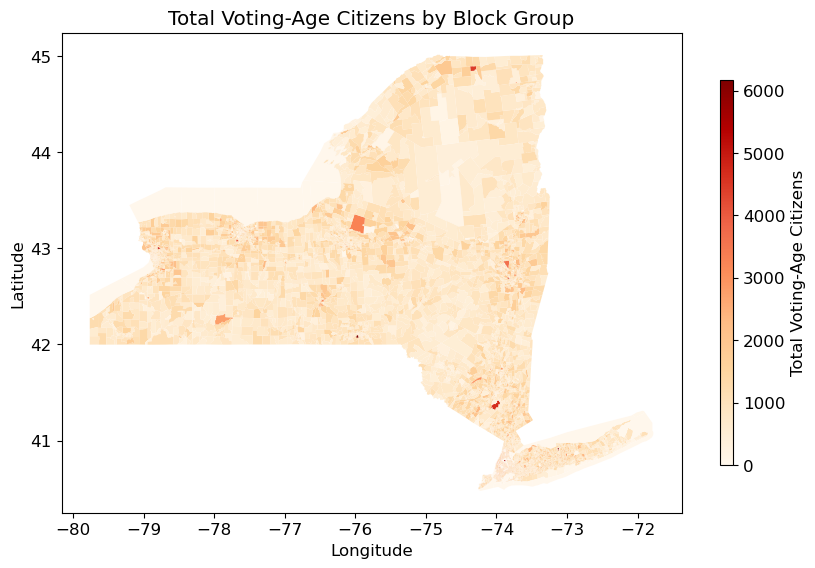

In [292]:
# Merge block_gdf with df_block using the GEOID column
variable_name = 'Total Voting-Age Citizens'
# Plot the merged GeoDataFrame
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
plot = merged_gdf_block.plot(column=variable_name, ax=ax, legend=False, cmap='OrRd')
ax.set_title(f'{variable_name} by Block Group')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

# Add color bar
sm = plt.cm.ScalarMappable(cmap='OrRd', norm=plt.Normalize(vmin=merged_gdf_block[variable_name].astype(int).min(), vmax=merged_gdf_block[variable_name].astype(int).max()))
sm._A = []
cbar = fig.colorbar(sm, ax=ax, aspect=30, shrink=0.5)
cbar.set_label(variable_name)

plt.show()

## Loading and Processing Precint Election Data

In [293]:
import geopandas as gpd
import matplotlib.pyplot as plt

# Load the shapefile
shapefile_path = "ny_2022_gen_prec/ny_2022_gen_prec/ny_2022_gen_prec.shp"  
gdf_precint = gpd.read_file(shapefile_path)

In [294]:
cong_15_UIDs = gdf_precint[gdf_precint["CONG_DIST"] == "15"]["UNIQUE_ID"]

In [295]:
gdf_precint['geometry'].is_valid.all()
sum(~gdf_precint['geometry'].is_valid)

4

In [296]:
# Filter columns that start with 'GCON', 'UNIQUE_ID', and 'geometry'
columns_to_keep = [col for col in gdf_precint.columns if col.startswith('GCON') or col in ['UNIQUE_ID', 'geometry']]

# Create a new GeoDataFrame with only the selected columns
filtered_gdf = gdf_precint[columns_to_keep]

In [297]:
# Define the columns to keep
columns_to_keep = ['GEOID', 'geometry'] + variables_to_plot

# Drop all other columns
merged_gdf_block = merged_gdf_block[columns_to_keep]

In [298]:
# Merge gdf_precint with merged_gdf_block using the GEOID column
merged_gdf_precint_block = gpd.sjoin(filtered_gdf, merged_gdf_block, how='inner', predicate='intersects')
columns_to_convert =  [
    'Total Population by Age and Sex', 'Total Female Population by Age', 'Total Voting-Age Citizens',
    'Voting-Age Citizens, 18-29', 'Voting-Age Citizens, 30-44', 'Voting-Age Citizens, 45-64',
    'Voting-Age Citizens, 65+', 'Less than 9th Grade',
    '9th-12th Grade, No Diploma', 'High School Graduate', 'Some College, No Degree', 'Associate’s Degree',
    'Bachelor’s Degree', 'Graduate/Professional Degree',
    'Income Below Poverty', 'Income Above Poverty', 'Median Household Income', 'Household Income (Adjusted)',
    'Median Household Income (Adjusted)', 'White Alone', 'Non-Hispanic White',
    'Non-Hispanic Black', 'Income to Poverty Ratio', 'Below 0.50 Poverty Line', 'Median Age',
    'Educational Attainment, 25+', 'Vacant Housing Units',	'Renter-Occupied Housing Units',	'Median Rent as % of Income'
]
merged_gdf_precint_block[columns_to_convert] = merged_gdf_precint_block[columns_to_convert].apply(pd.to_numeric, errors='coerce')

In [299]:
# Define the columns to average
columns_to_average = ['Median Age', 'Median Rent as % of Income', 'Median Household Income', 'Household Income (Adjusted)', 'Median Household Income (Adjusted)']

# Define the columns to sum which are not in the columns_to_average list and the 'UNIQUE_ID' and 'geometry' columns
columns_to_sum = [col for col in merged_gdf_precint_block.columns if col not in columns_to_average + ['UNIQUE_ID', 'geometry']]

# Group by 'UNIQUE_ID' and apply the appropriate aggregation functions
grouped_precint_block = merged_gdf_precint_block.groupby('UNIQUE_ID').agg(
    {**{col: 'mean' for col in columns_to_average}, **{col: 'sum' for col in columns_to_sum}}
).reset_index()

# Merge the geometry column back
grouped_precint_block['geometry'] = gdf_precint[gdf_precint['UNIQUE_ID'].isin(grouped_precint_block['UNIQUE_ID'])]['geometry']

# Convert to GeoDataFrame
grouped_precint_block = gpd.GeoDataFrame(grouped_precint_block, geometry='geometry')

In [300]:
# check if the geometry column is valid
sum(~gdf_precint['geometry'].is_valid)

4

In [301]:
# sum(~gdf_precint['geometry'].is_valid)
sum(~grouped_precint_block['geometry'].is_valid)

4

In [302]:
grouped_precint_block.shape

(13963, 113)

In [303]:
grouped_precint_block.reset_index(drop=True, inplace=True)

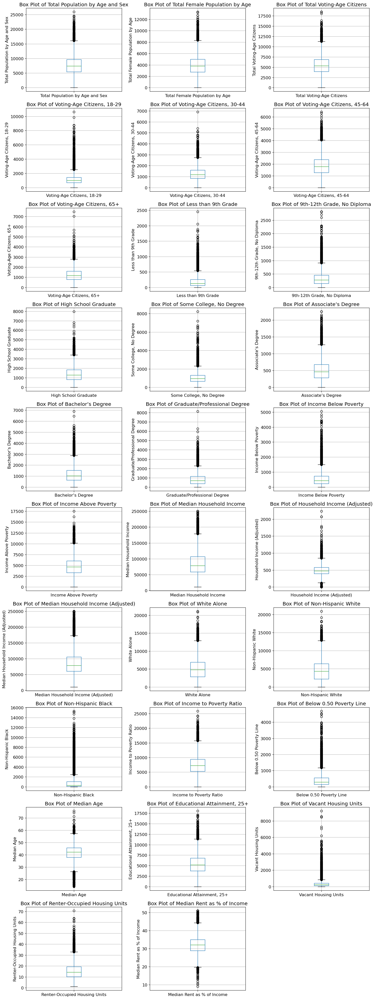

In [304]:
plot_box_plots(grouped_precint_block, variables_to_plot)

### Clean Data

In [305]:
# Replace NaN values with 1
# grouped_precint_block.fillna(1, inplace=True)
# Replace 0 values with 1
grouped_precint_block.replace(0, 1, inplace=True)

### Calculate Voter Turnout

In [306]:
# Create a new column 'tot' that sums all columns starting with 'GCON' indicating Congressional Election votes
grouped_precint_block['Total Votes'] = grouped_precint_block.filter(like='GCON').sum(axis=1)

# Display the updated DataFrame
# grouped_precint_block[["UNIQUE_ID", "Total Voting-Age Citizens", "Total Votes"]]
grouped_precint_block['Voter Turnout'] = grouped_precint_block['Total Votes'] / grouped_precint_block['Total Voting-Age Citizens']

### Check for Anomalies in Voter Turnout

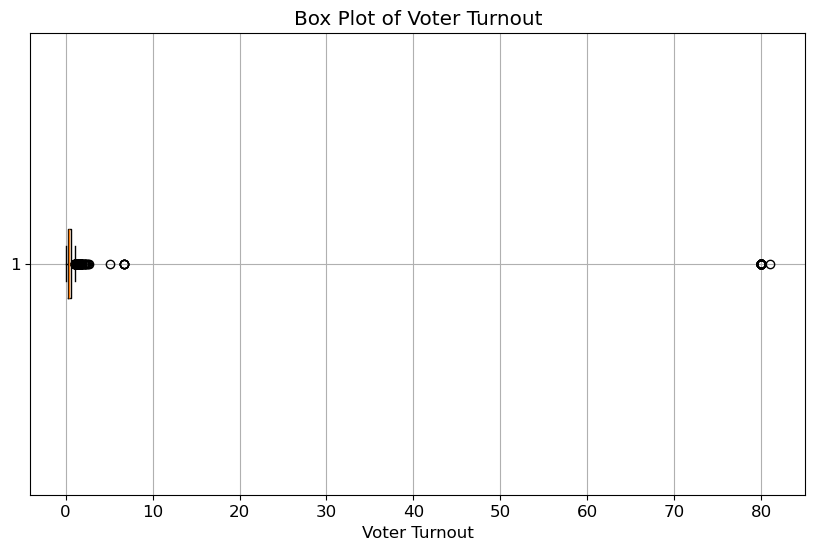

In [307]:
plt.figure(figsize=(10, 6))
plt.boxplot(grouped_precint_block['Voter Turnout'].dropna(), vert=False)
plt.title('Box Plot of Voter Turnout')
plt.xlabel('Voter Turnout')
plt.grid(True)
plt.show()

In [308]:
display(grouped_precint_block['Voter Turnout'].describe())
# Calculate the mode of the 'Voter Turnout' column
mode_voter_turnout = grouped_precint_block['Voter Turnout'].mean()

# Replace outliers greater than one with the mode
grouped_precint_block.loc[grouped_precint_block['Voter Turnout'] > 1, 'Voter Turnout'] = mode_voter_turnout

# Display the updated statistics
display(grouped_precint_block['Voter Turnout'].describe())
# grouped_precint_block = grouped_precint_block[grouped_precint_block['Voter Turnout'] <= 1]
# display(grouped_precint_block['Voter Turnout'].describe())

count    13963.000000
mean         1.045024
std          6.679377
min          0.005090
25%          0.298840
50%          0.452148
75%          0.630679
max         81.000000
Name: Voter Turnout, dtype: float64

count    13963.000000
mean         0.476718
std          0.248347
min          0.005090
25%          0.298840
50%          0.452148
75%          0.630679
max          1.045024
Name: Voter Turnout, dtype: float64

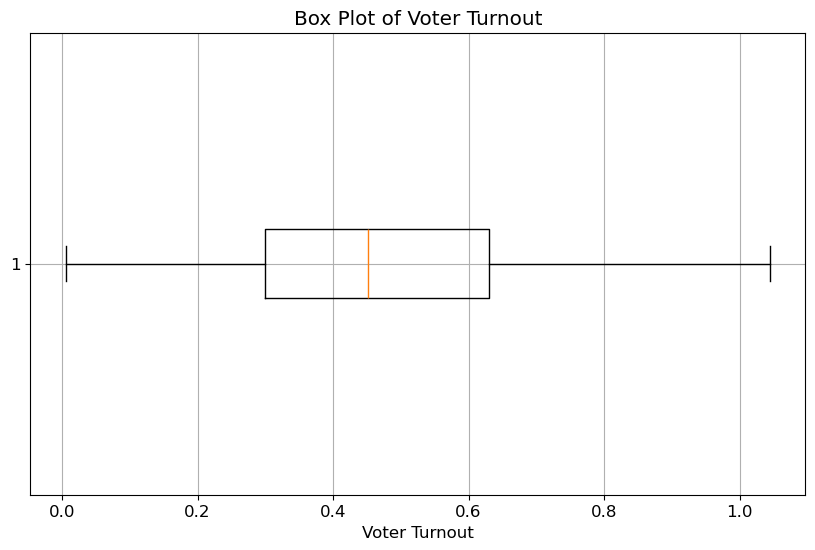

In [309]:
plt.figure(figsize=(10, 6))
plt.boxplot(grouped_precint_block['Voter Turnout'].dropna(), vert=False)
plt.title('Box Plot of Voter Turnout')
plt.xlabel('Voter Turnout')
plt.grid(True)
plt.show()

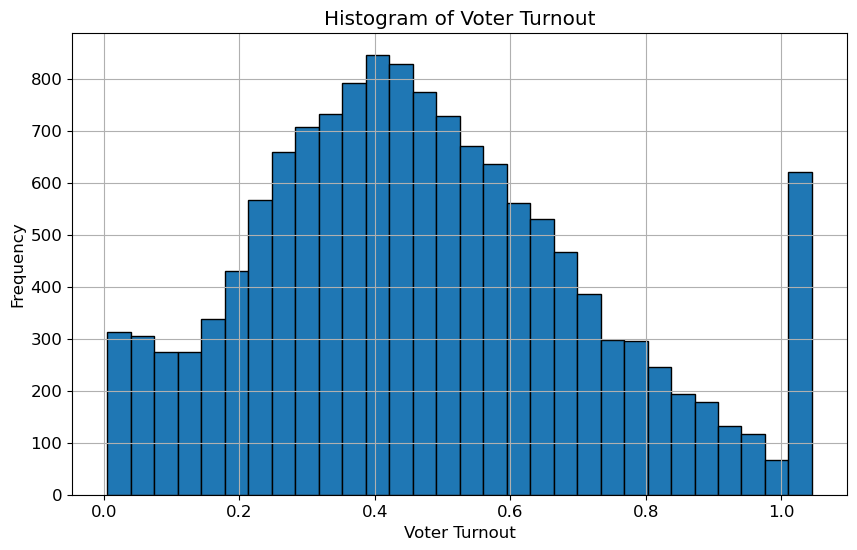

In [310]:
plt.figure(figsize=(10, 6))
plt.hist(grouped_precint_block['Voter Turnout'], bins=30, edgecolor='black')
plt.title('Histogram of Voter Turnout')
plt.xlabel('Voter Turnout')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

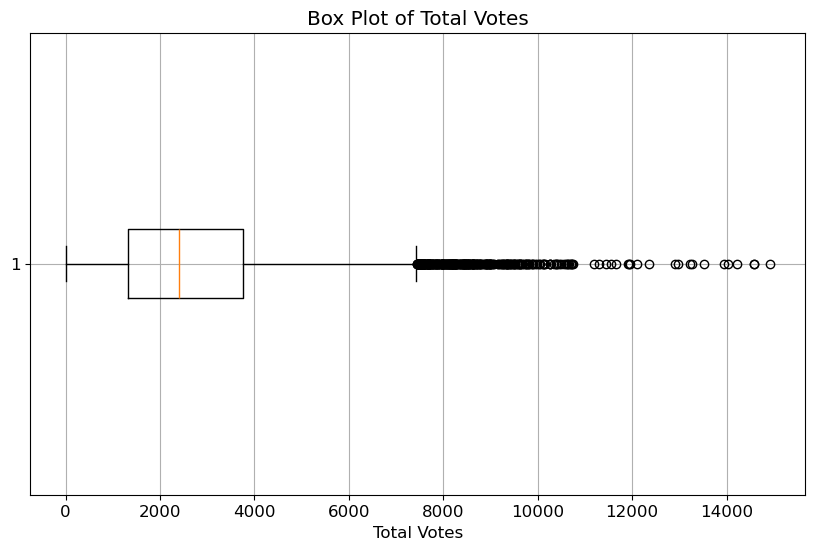

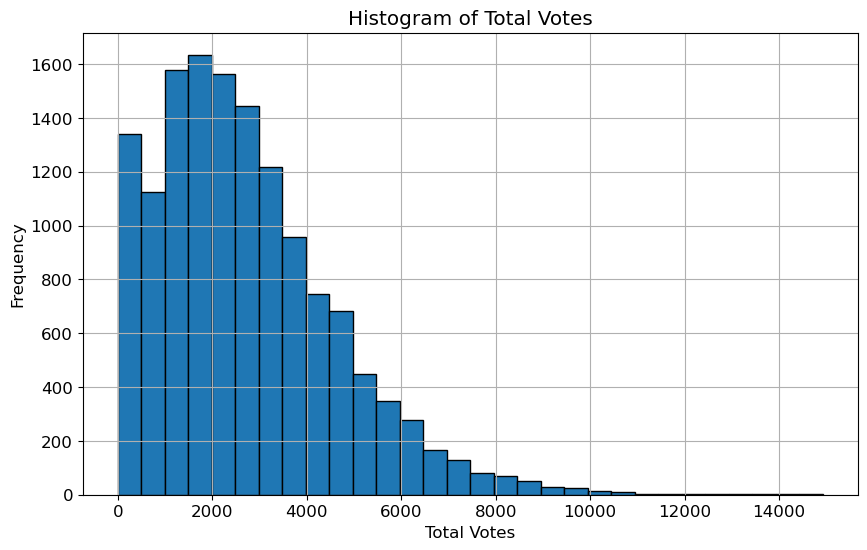

In [311]:
grouped_precint_block["Total Votes"] = grouped_precint_block["Total Voting-Age Citizens"] * grouped_precint_block["Voter Turnout"]
# Plot the box plot for Total Votes
plt.figure(figsize=(10, 6))
plt.boxplot(grouped_precint_block['Total Votes'].dropna(), vert=False)
plt.title('Box Plot of Total Votes')
plt.xlabel('Total Votes')
plt.grid(True)
plt.show()

# Plot the histogram for Total Votes
plt.figure(figsize=(10, 6))
plt.hist(grouped_precint_block['Total Votes'], bins=30, edgecolor='black')
plt.title('Histogram of Total Votes')
plt.xlabel('Total Votes')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

## GIS Plots

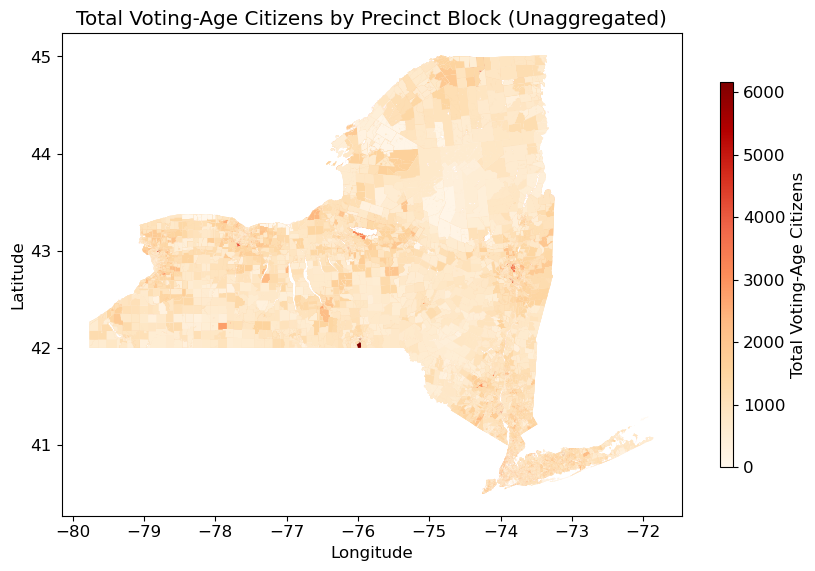

In [312]:
# Plot the merged GeoDataFrame for precinct blocks
variable_name = 'Total Voting-Age Citizens'
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
plot = merged_gdf_precint_block.plot(column= variable_name, ax=ax, legend=False, cmap='OrRd')
ax.set_title(f'{variable_name} by Precinct Block (Unaggregated)')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

# Add color bar
sm = plt.cm.ScalarMappable(cmap='OrRd', norm=plt.Normalize(vmin=merged_gdf_precint_block[variable_name].astype(int).min(), vmax=merged_gdf_precint_block[variable_name].astype(int).max()))
sm._A = []
cbar = fig.colorbar(sm, ax=ax, aspect=30, shrink=0.5)
cbar.set_label(variable_name)

plt.show()

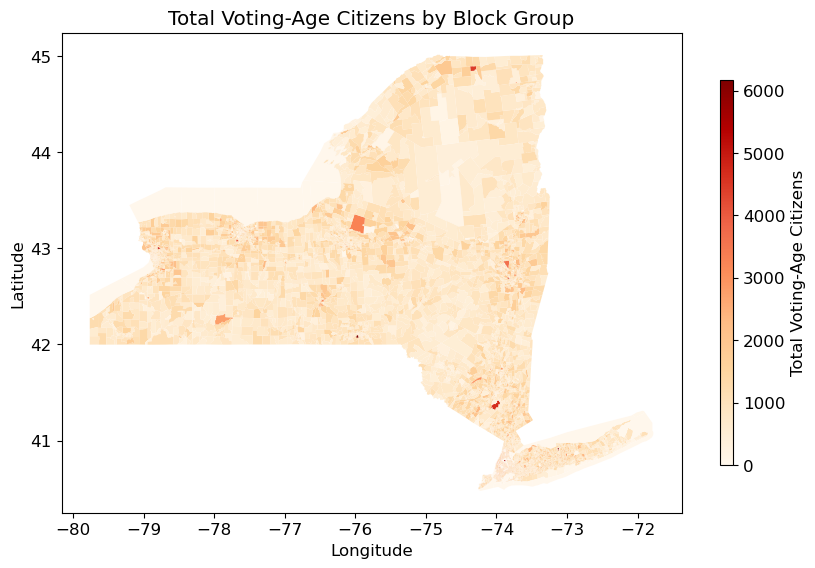

In [313]:
# Merge block_gdf with df_block using the GEOID column
variable_name = 'Total Voting-Age Citizens'
# Plot the merged GeoDataFrame
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
plot = merged_gdf_block.plot(column=variable_name, ax=ax, legend=False, cmap='OrRd')
ax.set_title(f'{variable_name} by Block Group')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

# Add color bar
sm = plt.cm.ScalarMappable(cmap='OrRd', norm=plt.Normalize(vmin=merged_gdf_block[variable_name].astype(int).min(), vmax=merged_gdf_block[variable_name].astype(int).max()))
sm._A = []
cbar = fig.colorbar(sm, ax=ax, aspect=30, shrink=0.5)
cbar.set_label(variable_name)

plt.show()

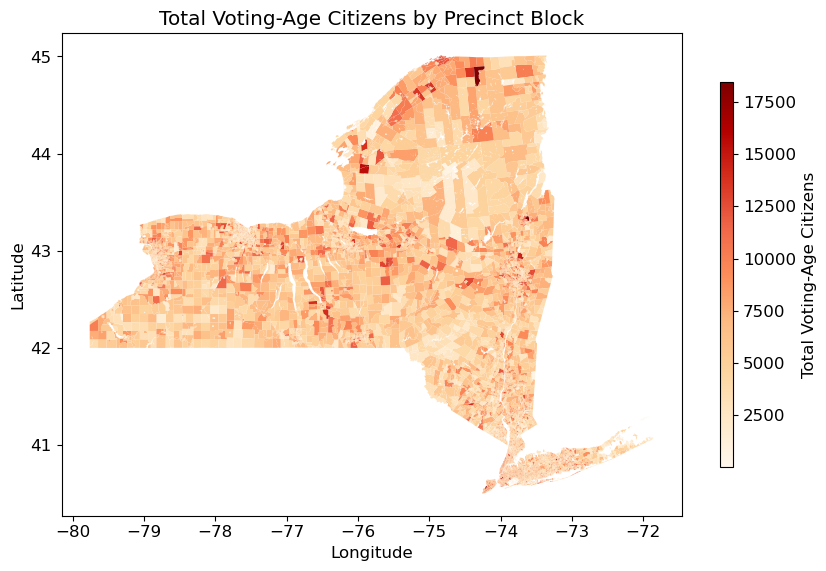

In [314]:
import matplotlib.pyplot as plt

variable_name = 'Total Voting-Age Citizens'
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
plot = grouped_precint_block.plot(column=variable_name, ax=ax, legend=False, cmap='OrRd')
ax.set_title(f'{variable_name} by Precinct Block')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

# Add color bar
sm = plt.cm.ScalarMappable(cmap='OrRd', norm=plt.Normalize(vmin=grouped_precint_block[variable_name].astype(float).min(), vmax=grouped_precint_block[variable_name].astype(float).max()))
sm._A = []
cbar = fig.colorbar(sm, ax=ax, aspect=30, shrink=0.5)
cbar.set_label(variable_name)

plt.show()

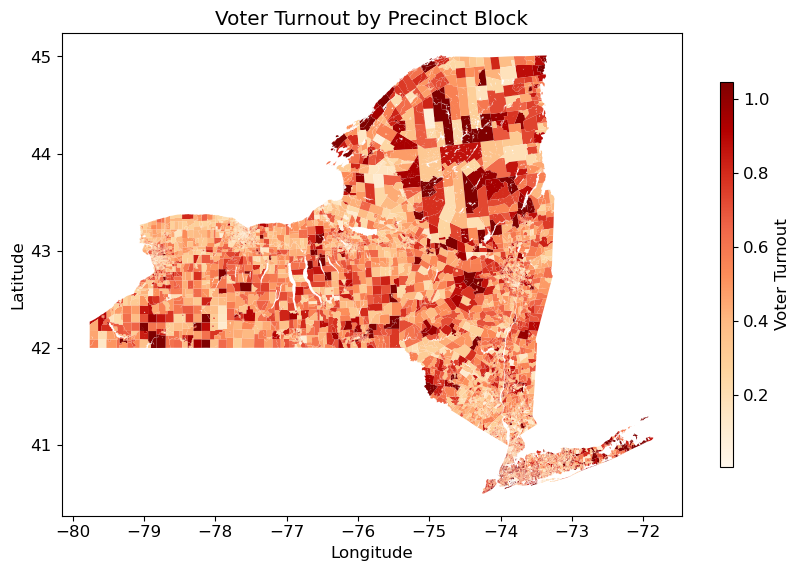

In [315]:
variable_name = 'Voter Turnout'
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
plot = grouped_precint_block.plot(column=variable_name, ax=ax, legend=False, cmap='OrRd')
ax.set_title(f'{variable_name} by Precinct Block')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

# Add color bar
sm = plt.cm.ScalarMappable(cmap='OrRd', norm=plt.Normalize(vmin=grouped_precint_block[variable_name].astype(float).min(), vmax=grouped_precint_block[variable_name].astype(float).max()))
sm._A = []
cbar = fig.colorbar(sm, ax=ax, aspect=30, shrink=0.5)
cbar.set_label(variable_name)

plt.show()

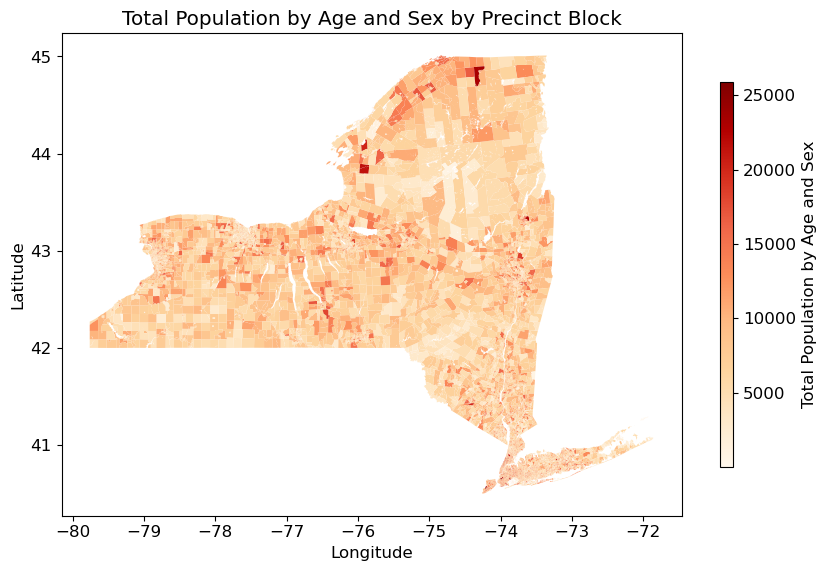

In [316]:
variable_name = 'Total Population by Age and Sex'
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
plot = grouped_precint_block.plot(column=variable_name, ax=ax, legend=False, cmap='OrRd')
ax.set_title(f'{variable_name} by Precinct Block')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

# Add color bar
sm = plt.cm.ScalarMappable(cmap='OrRd', norm=plt.Normalize(vmin=grouped_precint_block[variable_name].astype(float).min(), vmax=grouped_precint_block[variable_name].astype(float).max()))
sm._A = []
cbar = fig.colorbar(sm, ax=ax, aspect=30, shrink=0.5)
cbar.set_label(variable_name)

plt.show()

The total populaiton distribution not being uniform indicates a fault in the method we merged or processed the GIS dataframes.

In [317]:
grouped_precint_block['Total Population by Age and Sex'].describe()

count    13963.000000
mean      7706.475328
std       3310.072881
min          1.000000
25%       5401.000000
50%       7416.000000
75%       9672.000000
max      25902.000000
Name: Total Population by Age and Sex, dtype: float64

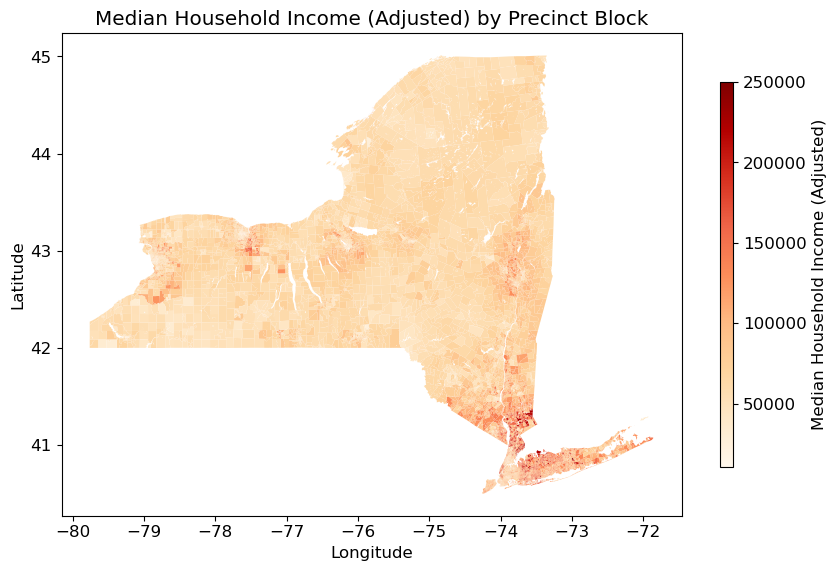

In [318]:
variable_name = 'Median Household Income (Adjusted)'
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
plot = grouped_precint_block.plot(column=variable_name, ax=ax, legend=False, cmap='OrRd')
ax.set_title(f'{variable_name} by Precinct Block')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

# Add color bar
sm = plt.cm.ScalarMappable(cmap='OrRd', norm=plt.Normalize(vmin=grouped_precint_block[variable_name].astype(float).min(), vmax=grouped_precint_block[variable_name].astype(float).max()))
sm._A = []
cbar = fig.colorbar(sm, ax=ax, aspect=30, shrink=0.5)
cbar.set_label(variable_name)

plt.show()

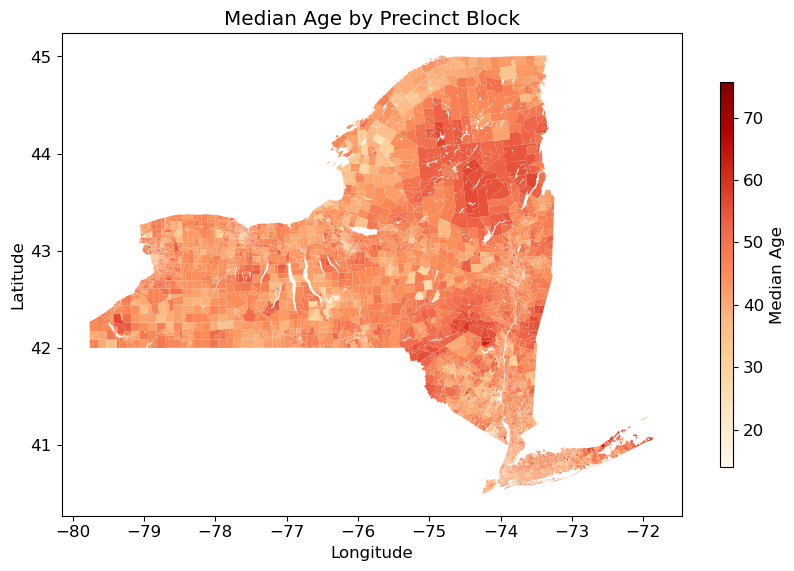

In [319]:
variable_name = 'Median Age'
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
plot = grouped_precint_block.plot(column=variable_name, ax=ax, legend=False, cmap='OrRd')
ax.set_title(f'{variable_name} by Precinct Block')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

# Add color bar
sm = plt.cm.ScalarMappable(cmap='OrRd', norm=plt.Normalize(vmin=grouped_precint_block[variable_name].astype(float).min(), vmax=grouped_precint_block[variable_name].astype(float).max()))
sm._A = []
cbar = fig.colorbar(sm, ax=ax, aspect=30, shrink=0.5)
cbar.set_label(variable_name)

plt.show()

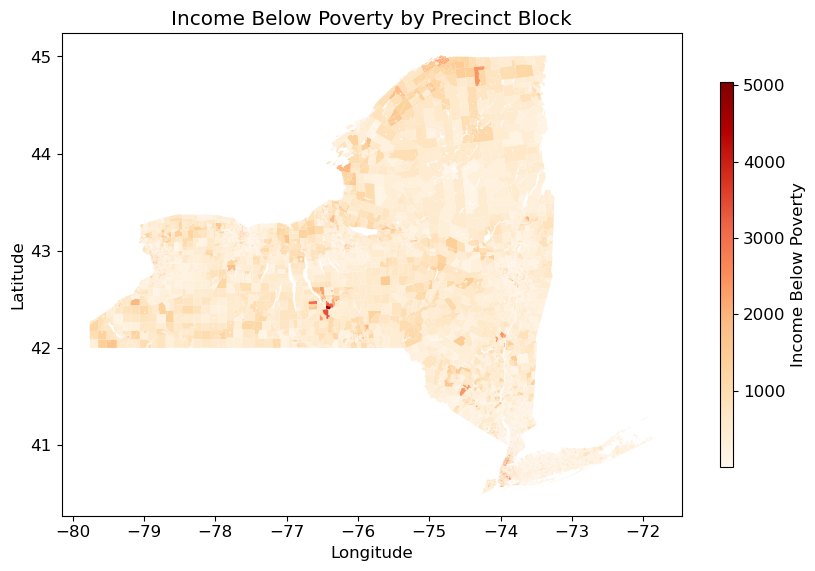

In [320]:
variable_name = 'Income Below Poverty'
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
plot = grouped_precint_block.plot(column=variable_name, ax=ax, legend=False, cmap='OrRd')
ax.set_title(f'{variable_name} by Precinct Block')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

# Add color bar
sm = plt.cm.ScalarMappable(cmap='OrRd', norm=plt.Normalize(vmin=grouped_precint_block[variable_name].astype(float).min(), vmax=grouped_precint_block[variable_name].astype(float).max()))
sm._A = []
cbar = fig.colorbar(sm, ax=ax, aspect=30, shrink=0.5)
cbar.set_label(variable_name)

plt.show()

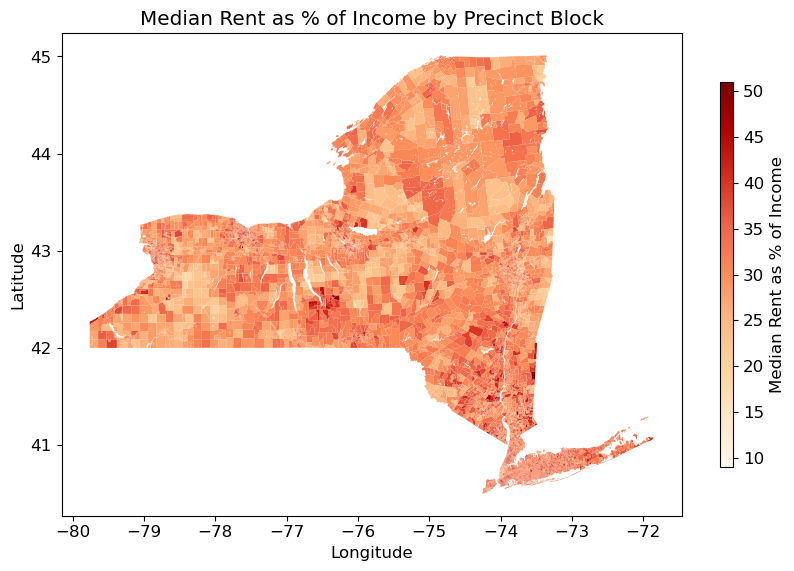

In [321]:
variable_name = 'Median Rent as % of Income'
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
plot = grouped_precint_block.plot(column=variable_name, ax=ax, legend=False, cmap='OrRd')
ax.set_title(f'{variable_name} by Precinct Block')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

# Add color bar
sm = plt.cm.ScalarMappable(cmap='OrRd', norm=plt.Normalize(vmin=grouped_precint_block[variable_name].astype(float).min(), vmax=grouped_precint_block[variable_name].astype(float).max()))
sm._A = []
cbar = fig.colorbar(sm, ax=ax, aspect=30, shrink=0.5)
cbar.set_label(variable_name)

plt.show()

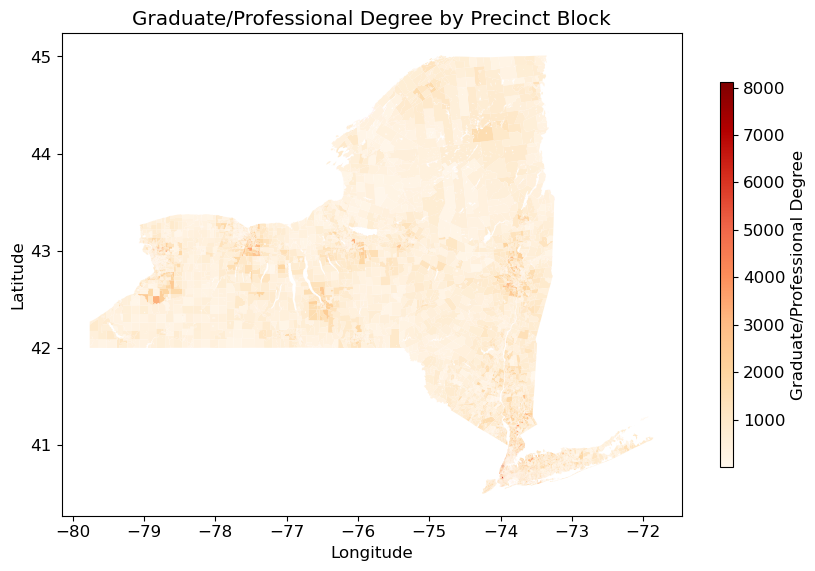

In [322]:
variable_name = 'Graduate/Professional Degree'
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
plot = grouped_precint_block.plot(column=variable_name, ax=ax, legend=False, cmap='OrRd')
ax.set_title(f'{variable_name} by Precinct Block')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

# Add color bar
sm = plt.cm.ScalarMappable(cmap='OrRd', norm=plt.Normalize(vmin=grouped_precint_block[variable_name].astype(float).min(), vmax=grouped_precint_block[variable_name].astype(float).max()))
sm._A = []
cbar = fig.colorbar(sm, ax=ax, aspect=30, shrink=0.5)
cbar.set_label(variable_name)

plt.show()

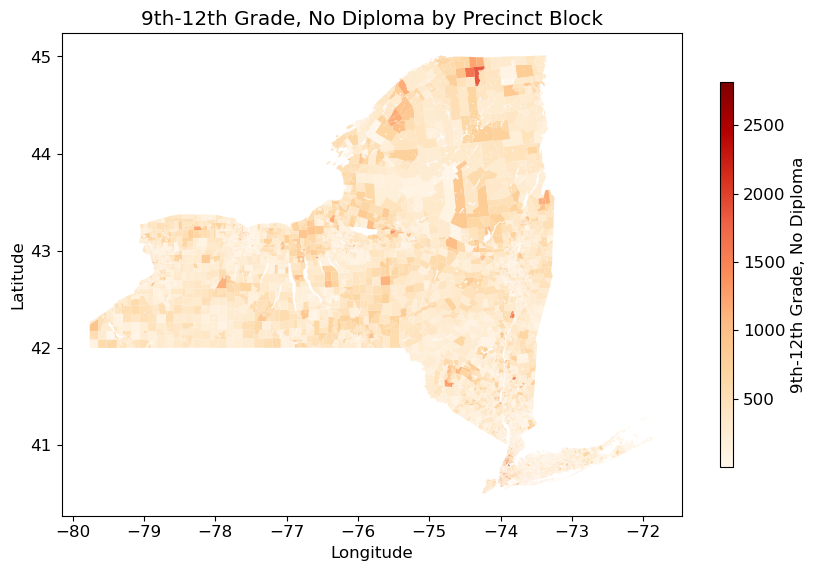

In [323]:
variable_name = '9th-12th Grade, No Diploma'
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
plot = grouped_precint_block.plot(column=variable_name, ax=ax, legend=False, cmap='OrRd')
ax.set_title(f'{variable_name} by Precinct Block')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

# Add color bar
sm = plt.cm.ScalarMappable(cmap='OrRd', norm=plt.Normalize(vmin=grouped_precint_block[variable_name].astype(float).min(), vmax=grouped_precint_block[variable_name].astype(float).max()))
sm._A = []
cbar = fig.colorbar(sm, ax=ax, aspect=30, shrink=0.5)
cbar.set_label(variable_name)

plt.show()

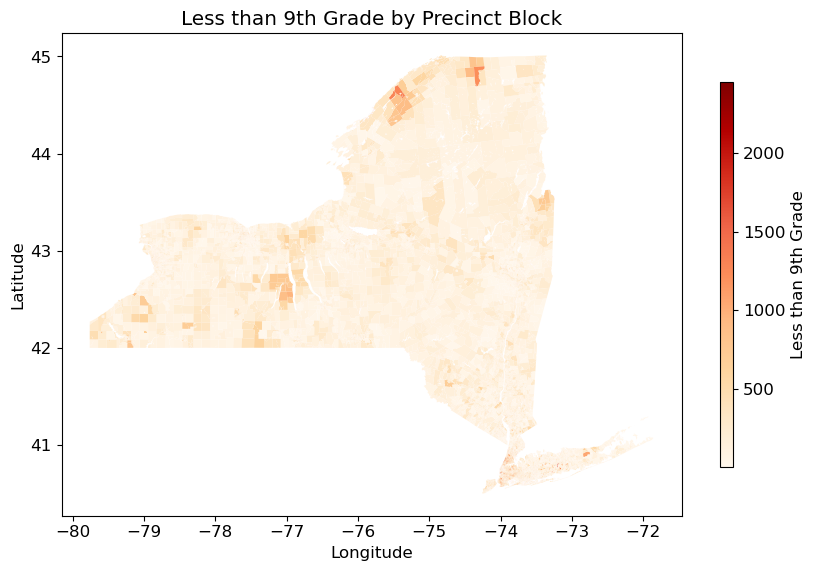

In [324]:
variable_name = 'Less than 9th Grade'
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
plot = grouped_precint_block.plot(column=variable_name, ax=ax, legend=False, cmap='OrRd')
ax.set_title(f'{variable_name} by Precinct Block')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

# Add color bar
sm = plt.cm.ScalarMappable(cmap='OrRd', norm=plt.Normalize(vmin=grouped_precint_block[variable_name].astype(float).min(), vmax=grouped_precint_block[variable_name].astype(float).max()))
sm._A = []
cbar = fig.colorbar(sm, ax=ax, aspect=30, shrink=0.5)
cbar.set_label(variable_name)

plt.show()

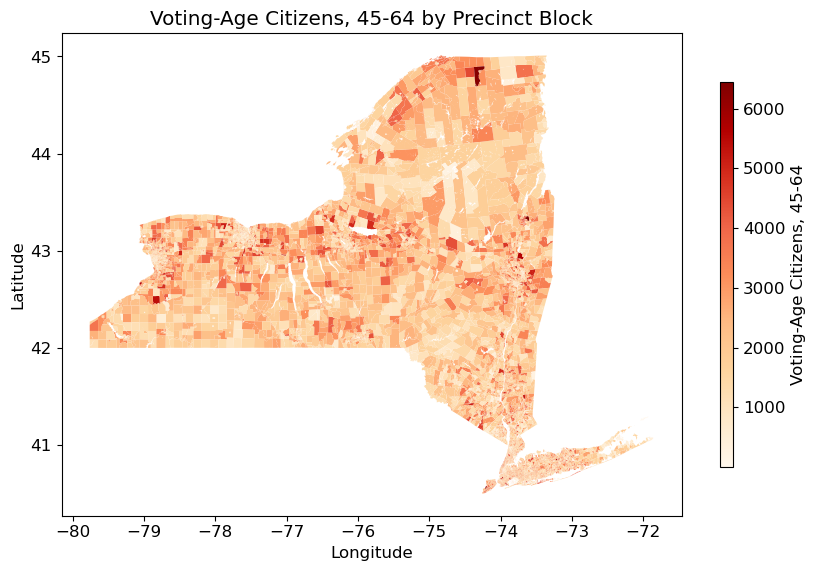

In [325]:
variable_name = 'Voting-Age Citizens, 45-64'
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
plot = grouped_precint_block.plot(column=variable_name, ax=ax, legend=False, cmap='OrRd')
ax.set_title(f'{variable_name} by Precinct Block')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

# Add color bar
sm = plt.cm.ScalarMappable(cmap='OrRd', norm=plt.Normalize(vmin=grouped_precint_block[variable_name].astype(float).min(), vmax=grouped_precint_block[variable_name].astype(float).max()))
sm._A = []
cbar = fig.colorbar(sm, ax=ax, aspect=30, shrink=0.5)
cbar.set_label(variable_name)

plt.show()

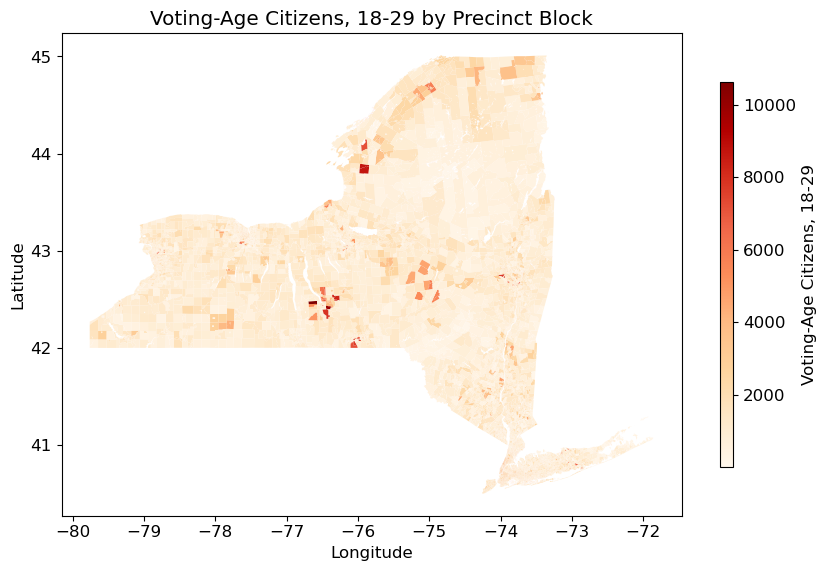

In [326]:
variable_name = 'Voting-Age Citizens, 18-29'
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
plot = grouped_precint_block.plot(column=variable_name, ax=ax, legend=False, cmap='OrRd')
ax.set_title(f'{variable_name} by Precinct Block')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

# Add color bar
sm = plt.cm.ScalarMappable(cmap='OrRd', norm=plt.Normalize(vmin=grouped_precint_block[variable_name].astype(float).min(), vmax=grouped_precint_block[variable_name].astype(float).max()))
sm._A = []
cbar = fig.colorbar(sm, ax=ax, aspect=30, shrink=0.5)
cbar.set_label(variable_name)

plt.show()

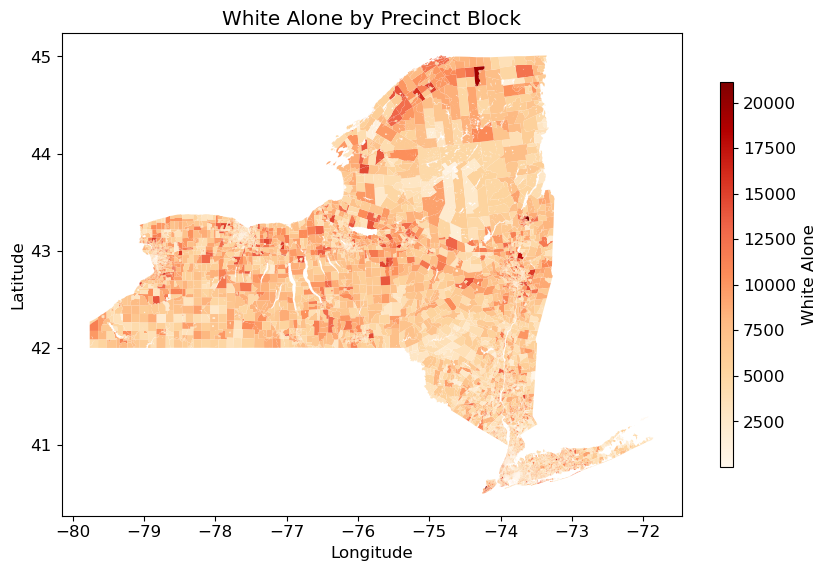

In [327]:
variable_name = 'White Alone'
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
plot = grouped_precint_block.plot(column=variable_name, ax=ax, legend=False, cmap='OrRd')
ax.set_title(f'{variable_name} by Precinct Block')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

# Add color bar
sm = plt.cm.ScalarMappable(cmap='OrRd', norm=plt.Normalize(vmin=grouped_precint_block[variable_name].astype(float).min(), vmax=grouped_precint_block[variable_name].astype(float).max()))
sm._A = []
cbar = fig.colorbar(sm, ax=ax, aspect=30, shrink=0.5)
cbar.set_label(variable_name)

plt.show()

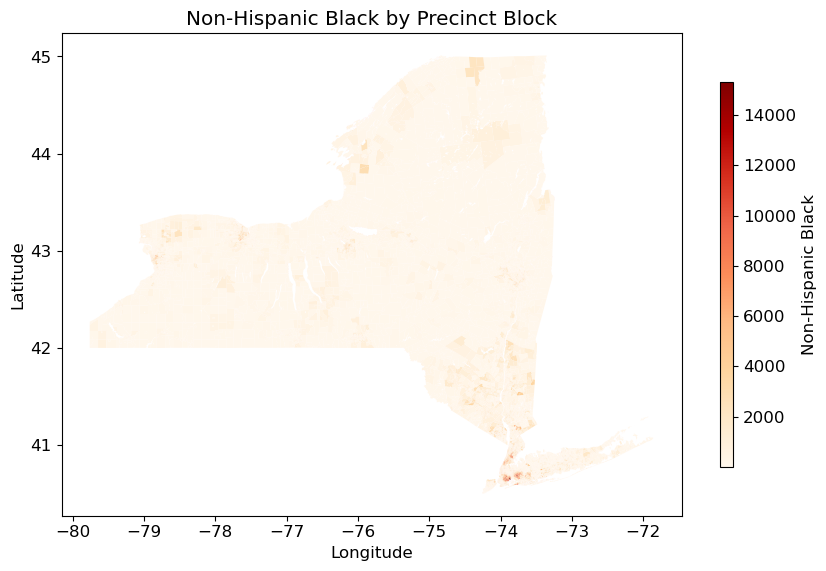

In [328]:
variable_name = 'Non-Hispanic Black'
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
plot = grouped_precint_block.plot(column=variable_name, ax=ax, legend=False, cmap='OrRd')
ax.set_title(f'{variable_name} by Precinct Block')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

# Add color bar
sm = plt.cm.ScalarMappable(cmap='OrRd', norm=plt.Normalize(vmin=grouped_precint_block[variable_name].astype(float).min(), vmax=grouped_precint_block[variable_name].astype(float).max()))
sm._A = []
cbar = fig.colorbar(sm, ax=ax, aspect=30, shrink=0.5)
cbar.set_label(variable_name)

plt.show()

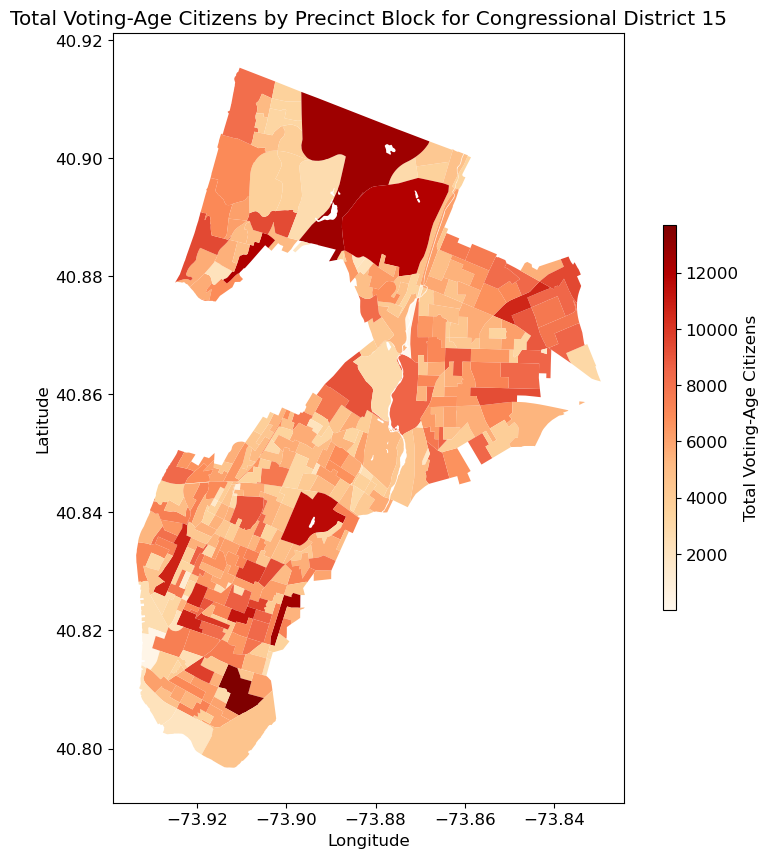

In [329]:
# Filter the GeoDataFrame for the specified UNIQUE_IDs
filtered_gdf = grouped_precint_block[grouped_precint_block['UNIQUE_ID'].isin(cong_15_UIDs)]

# Plot the filtered GeoDataFrame
variable_name = 'Total Voting-Age Citizens'
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
plot = filtered_gdf.plot(column=variable_name, ax=ax, legend=False, cmap='OrRd')
ax.set_title(f'{variable_name} by Precinct Block for Congressional District 15')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

# Add color bar
sm = plt.cm.ScalarMappable(cmap='OrRd', norm=plt.Normalize(vmin=filtered_gdf[variable_name].astype(float).min(), vmax=filtered_gdf[variable_name].astype(float).max()))
sm._A = []
cbar = fig.colorbar(sm, ax=ax, aspect=30, shrink=0.5)
cbar.set_label(variable_name)

plt.show()

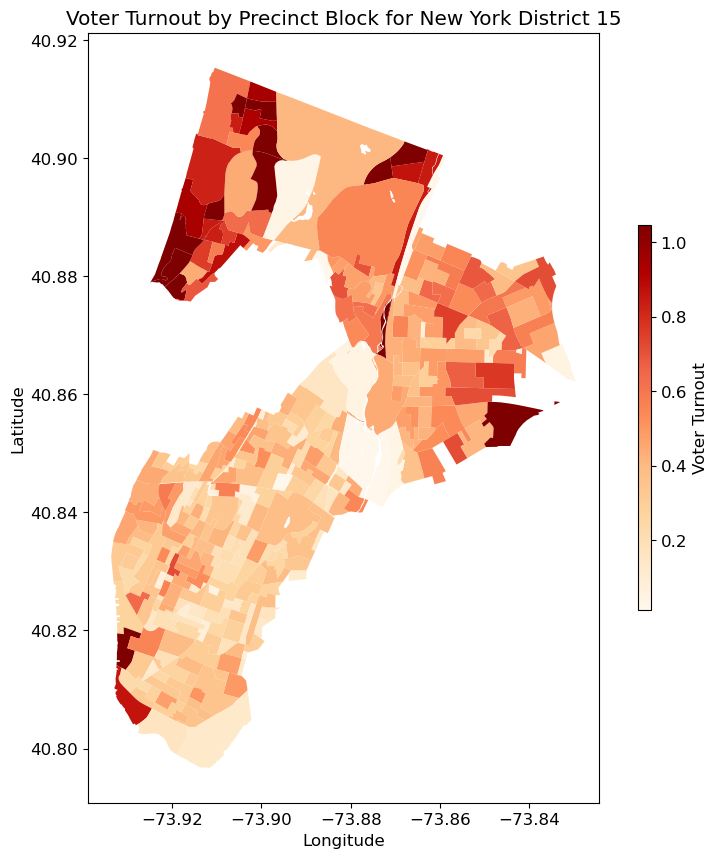

In [330]:
# Plot the filtered GeoDataFrame
variable_name = 'Voter Turnout'
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
plot = filtered_gdf.plot(column=variable_name, ax=ax, legend=False, cmap='OrRd')
ax.set_title(f'{variable_name} by Precinct Block for New York District 15')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

# Add color bar
sm = plt.cm.ScalarMappable(cmap='OrRd', norm=plt.Normalize(vmin=filtered_gdf[variable_name].astype(float).min(), vmax=filtered_gdf[variable_name].astype(float).max()))
sm._A = []
cbar = fig.colorbar(sm, ax=ax, aspect=30, shrink=0.5)
cbar.set_label(variable_name)

plt.show()

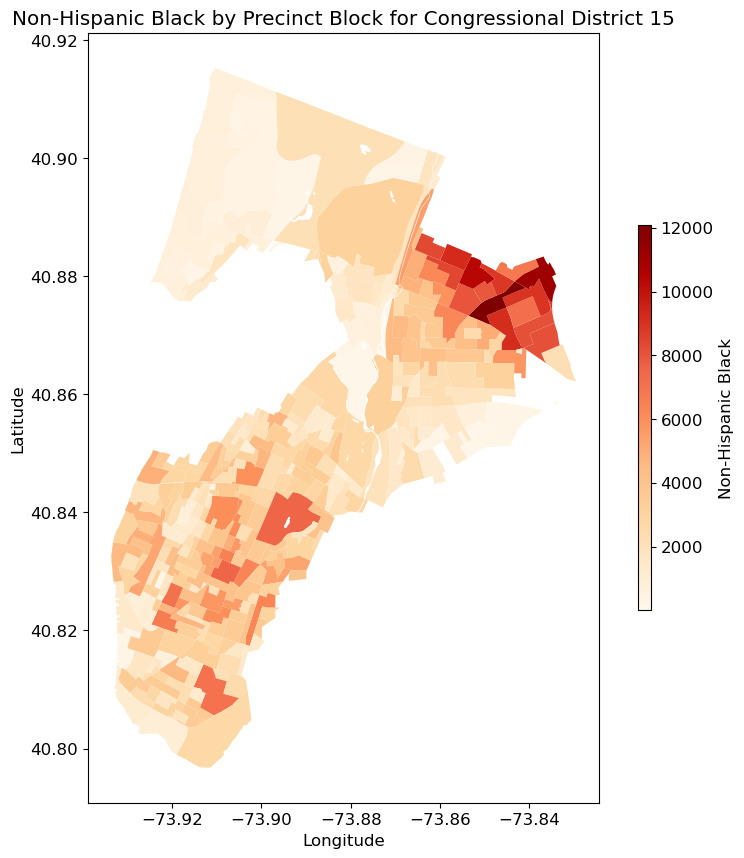

In [331]:
# Plot the filtered GeoDataFrame
variable_name = 'Non-Hispanic Black'
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
plot = filtered_gdf.plot(column=variable_name, ax=ax, legend=False, cmap='OrRd')
ax.set_title(f'{variable_name} by Precinct Block for Congressional District 15')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
plt.rcParams
# Add color bar
sm = plt.cm.ScalarMappable(cmap='OrRd', norm=plt.Normalize(vmin=filtered_gdf[variable_name].astype(float).min(), vmax=filtered_gdf[variable_name].astype(float).max()))
sm._A = []
cbar = fig.colorbar(sm, ax=ax, aspect=30, shrink=0.5)
cbar.set_label(variable_name)

plt.show()

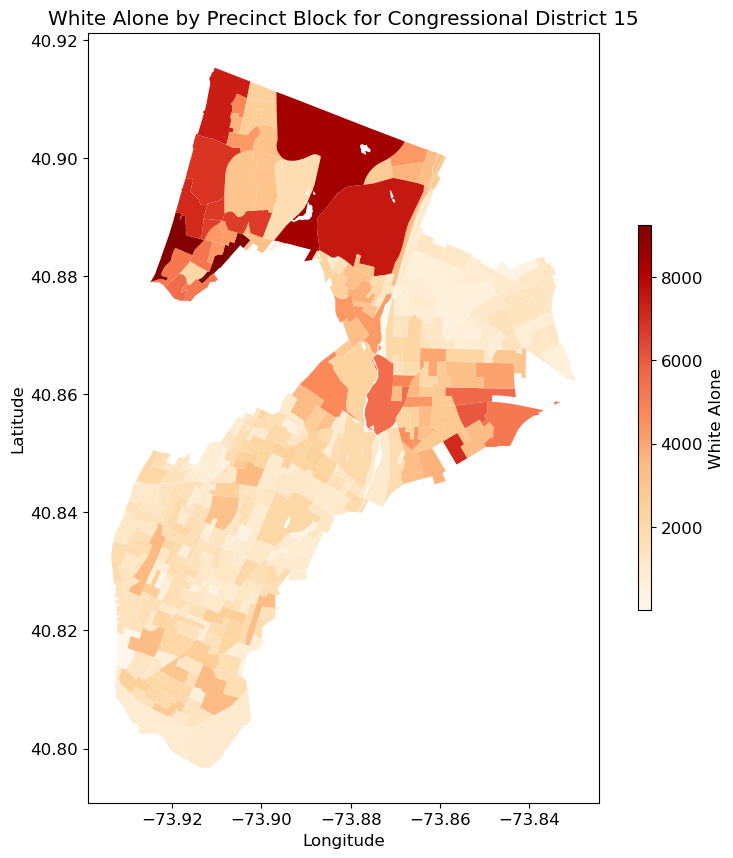

In [332]:
# Plot the filtered GeoDataFrame
variable_name = 'White Alone'
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
plot = filtered_gdf.plot(column=variable_name, ax=ax, legend=False, cmap='OrRd')
ax.set_title(f'{variable_name} by Precinct Block for Congressional District 15')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

# Add color bar
sm = plt.cm.ScalarMappable(cmap='OrRd', norm=plt.Normalize(vmin=filtered_gdf[variable_name].astype(float).min(), vmax=filtered_gdf[variable_name].astype(float).max()))
sm._A = []
cbar = fig.colorbar(sm, ax=ax, aspect=30, shrink=0.5)
cbar.set_label(variable_name)

plt.show()

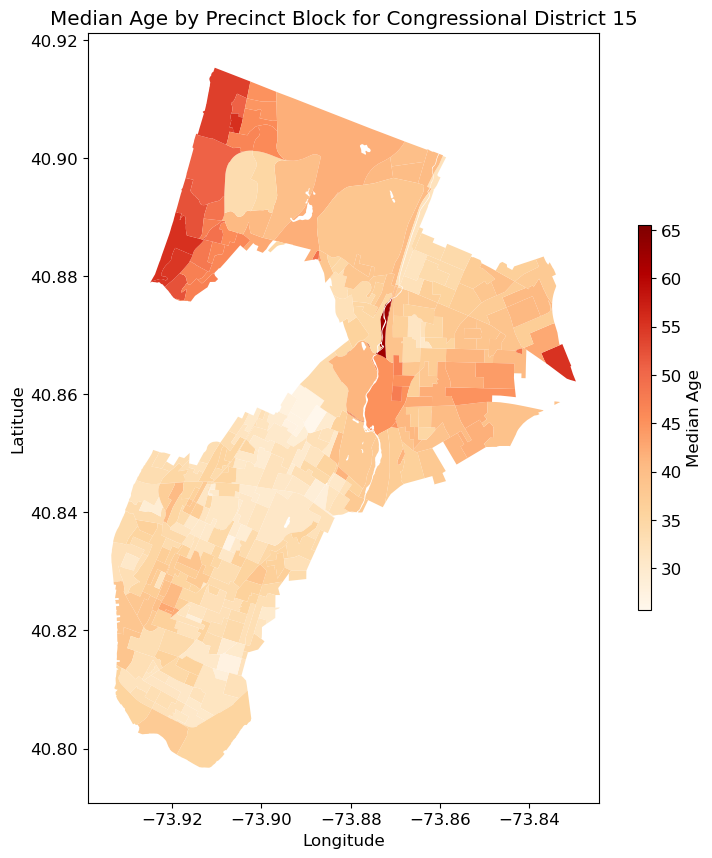

In [333]:
# Plot the filtered GeoDataFrame
variable_name = 'Median Age'
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
plot = filtered_gdf.plot(column=variable_name, ax=ax, legend=False, cmap='OrRd')
ax.set_title(f'{variable_name} by Precinct Block for Congressional District 15')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

# Add color bar
sm = plt.cm.ScalarMappable(cmap='OrRd', norm=plt.Normalize(vmin=filtered_gdf[variable_name].astype(float).min(), vmax=filtered_gdf[variable_name].astype(float).max()))
sm._A = []
cbar = fig.colorbar(sm, ax=ax, aspect=30, shrink=0.5)
cbar.set_label(variable_name)

plt.show()

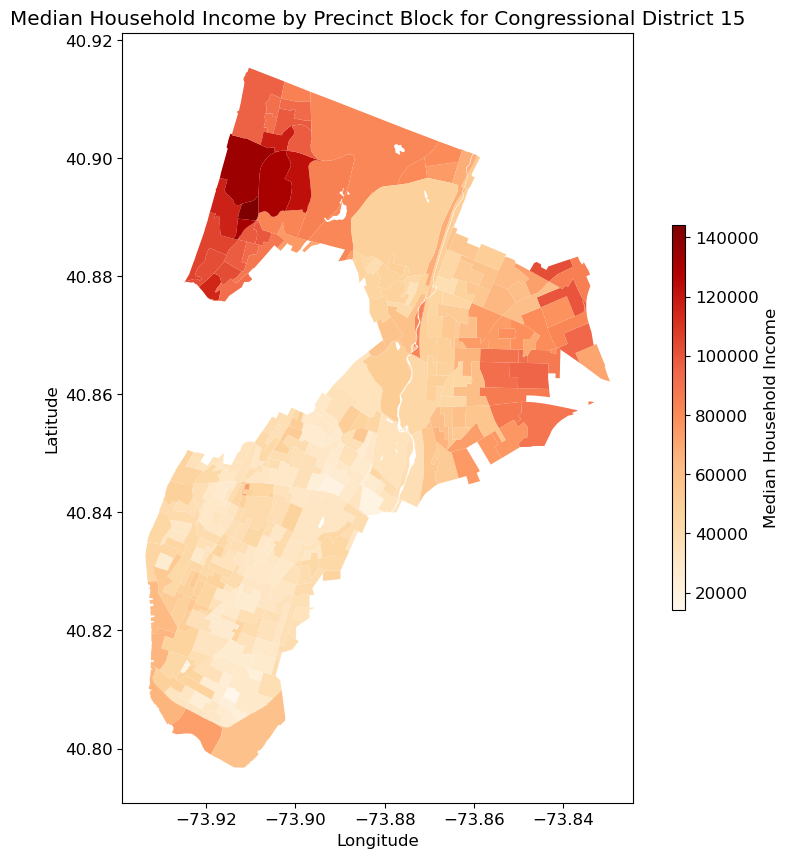

In [334]:
# Plot the filtered GeoDataFrame
variable_name = 'Median Household Income'
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
plot = filtered_gdf.plot(column=variable_name, ax=ax, legend=False, cmap='OrRd')
ax.set_title(f'{variable_name} by Precinct Block for Congressional District 15')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

# Add color bar
sm = plt.cm.ScalarMappable(cmap='OrRd', norm=plt.Normalize(vmin=filtered_gdf[variable_name].astype(float).min(), vmax=filtered_gdf[variable_name].astype(float).max()))
sm._A = []
cbar = fig.colorbar(sm, ax=ax, aspect=30, shrink=0.5)
cbar.set_label(variable_name)

plt.show()

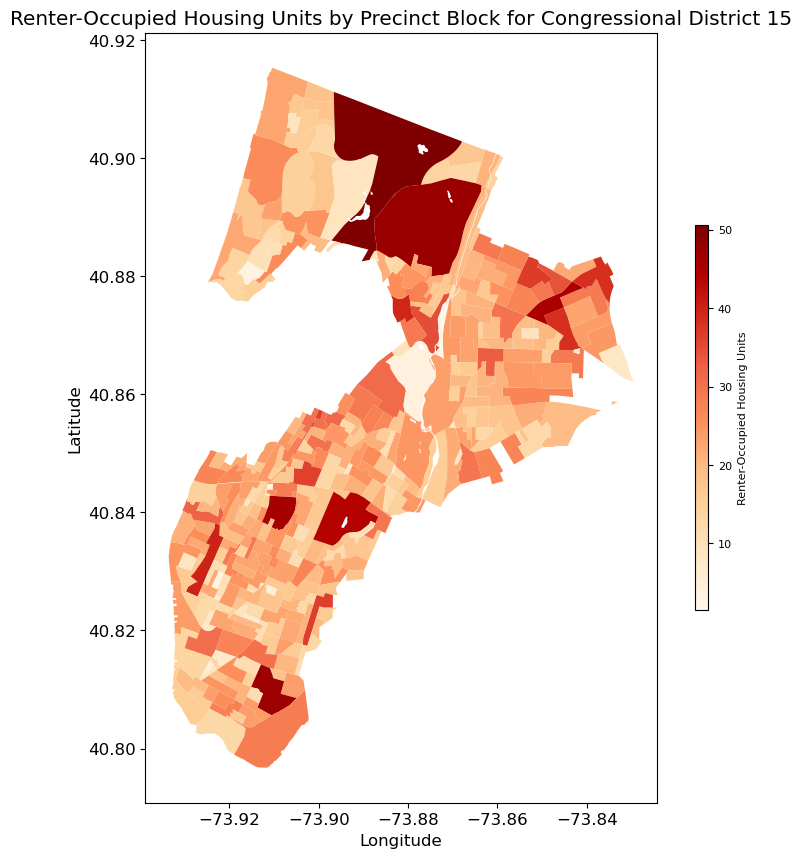

In [335]:
# plot renter occupied housing units
variable_name = 'Renter-Occupied Housing Units'
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
plot = filtered_gdf.plot(column=variable_name, ax=ax, legend=False, cmap='OrRd')
ax.set_title(f'{variable_name} by Precinct Block for Congressional District 15')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

# Add color bar
sm = plt.cm.ScalarMappable(cmap='OrRd', norm=plt.Normalize(vmin=filtered_gdf[variable_name].astype(float).min(), vmax=filtered_gdf[variable_name].astype(float).max()))
plt.rcParams["font.size"] = 8
sm._A = []
cbar = fig.colorbar(sm, ax=ax, aspect=30, shrink=0.5)
cbar.set_label(variable_name)

plt.show()


## Eleection Data 

In [336]:
ny_parties = gpd.read_file("ny_2022_gen_prec/ny_2022_gen_prec_PARTIES/ny_2022_gen_prec_PARTIES.shp")

In [337]:
import re

# Define a function to map the party code to the party name
def map_party(party_code):
    party_map = {
        'A': 'Arts & Culture',
        'B': 'Broadband Now Party',
        'C': 'Conservative',
        'D': 'Democratic',
        'E': 'We the People Party',
        'F': 'Medical Freedom Party',
        'H': 'Rent is 2 Damn High Party',
        'I': 'Independence',
        'L': 'LaRouche Party',
        'M': 'Moderate Party',
        'O': 'Other / Write In',
        'P': 'Parent Party',
        'R': 'Republican',
        'T': 'Integrity Party',
        'W': 'Working Families Party',
        'X': 'Independent'
    }
    return party_map.get(party_code, 'Unknown')

# Extract candidate columns and map to parties
candidate_columns = [col for col in ny_parties.columns if col.startswith('GCON')]
candidate_party_map = {col: map_party(col[6]) for col in candidate_columns}

# Display the mapping
# for candidate, party in candidate_party_map.items():
    # print(f"{candidate}: {party}")

party_colormap = {}
for party in set(candidate_party_map.values()):
    if party in ['Democratic', 'Republican']:
        party_colormap[party] = 'blue' if party == 'Democratic' else 'red'
    else:
        party_colormap[party] = 'yellow'
party_colormap

{'Other / Write In': 'yellow',
 'Medical Freedom Party': 'yellow',
 'Moderate Party': 'yellow',
 'Working Families Party': 'yellow',
 'Republican': 'red',
 'Conservative': 'yellow',
 'Democratic': 'blue',
 'Parent Party': 'yellow'}

Winner_Party
Democratic                8168
Republican                5245
Conservative               546
Working Families Party       4
Name: count, dtype: int64


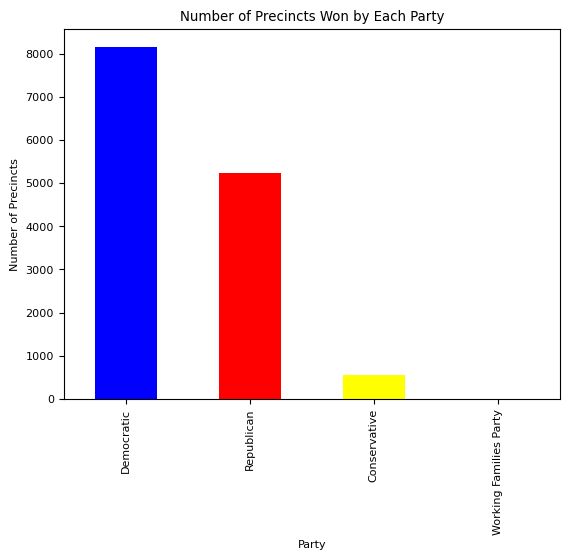

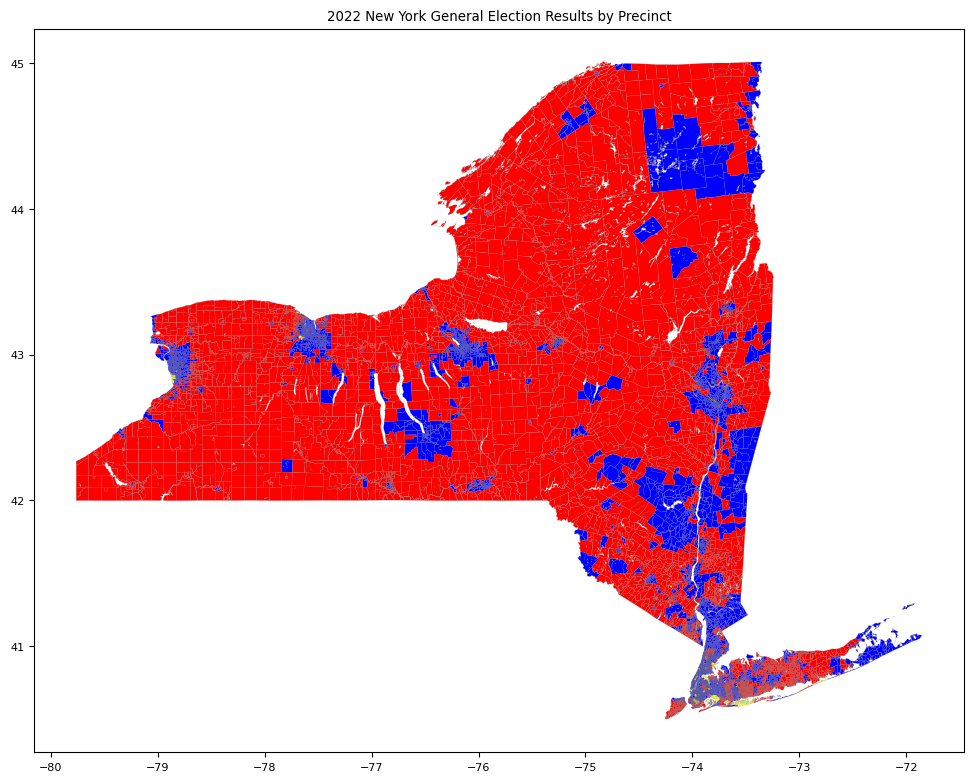

In [338]:
import geopandas as gpd
import matplotlib.pyplot as plt

# Identify the winning candidate based on the maximum votes among the selected columns
ny_parties['Winner_Candidate'] = ny_parties[candidate_columns].idxmax(axis=1)

# Map the winning candidate to their respective party
ny_parties['Winner_Party'] = ny_parties['Winner_Candidate'].map(candidate_party_map)
print(ny_parties['Winner_Party'].value_counts())
# ny_parties['Winner_Party'].value_counts()
ny_parties['Winner_Party'].value_counts().plot(kind='bar', color=['blue', 'red', 'yellow', 'green'])
plt.title('Number of Precincts Won by Each Party')
plt.xlabel('Party')
plt.ylabel('Number of Precincts')
plt.show()
# Filter to retain only Democratic and Republican winners
# ny_parties = ny_parties[ny_parties['Winner_Party'].isin(['Democratic', 'Republican'])]

# Map colors to the Winner_Party column using party_colormap
ny_parties['color'] = ny_parties['Winner_Party'].map(party_colormap)

# Check for NaN values in the 'color' column and fill with a default color if any
ny_parties['color'].fillna('grey', inplace=True)

# Merge precinct data with party results
election_merged = grouped_precint_block.merge(ny_parties[['UNIQUE_ID', 'Winner_Party', 'color']], on='UNIQUE_ID', how='inner')

# Plot the map with colored precincts
fig, ax = plt.subplots(figsize=(12, 12))
election_merged.plot(column='color', color=ny_parties['color'], legend = True ,linewidth=0.1, ax=ax, edgecolor='0.5')
ax.set_title("2022 New York General Election Results by Precinct")
plt.show()

In [339]:
# Merge precinct data with party results
election_merged = grouped_precint_block.merge(ny_parties[['UNIQUE_ID', 'Winner_Party', 'color']], on='UNIQUE_ID', how='inner')

In [340]:
# cong_15_UIDs = gdf_precint[gdf_precint["CONG_DIST"] == "15"]["UNIQUE_ID"]
election_merged.columns

columns_to_drop = [col for col in election_merged.columns if col.startswith('GCON') or col in ['color', 'UNIQUE_ID', 'geometry']]
prediction_data = election_merged.drop(columns=columns_to_drop, inplace=False)

In [341]:
prediction_data['Winner_Party'] = prediction_data['Winner_Party'].map({'Democratic': 1, 'Republican': 2, 'Conservative': 0, 'Working Families Party': 0})

In [342]:
prediction_data['Winner_Party'].value_counts()

Winner_Party
1    8168
2    5245
0     550
Name: count, dtype: int64

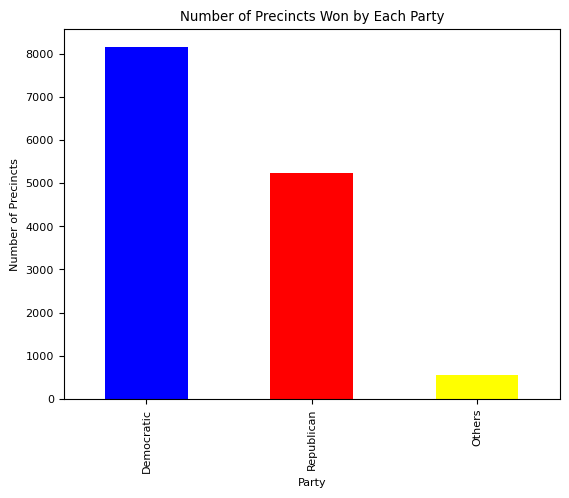

In [343]:
# bar plot of predictin winner party
prediction_data['Winner_Party'].value_counts().plot(kind='bar', color=['blue', 'red', 'yellow', 'green'])
plt.title('Number of Precincts Won by Each Party')
plt.xlabel('Party')
plt.ylabel('Number of Precincts')
# label the x_ticks 
plt.xticks(ticks=[0, 1, 2], labels=['Democratic', 'Republican', 'Others'])
plt.show()

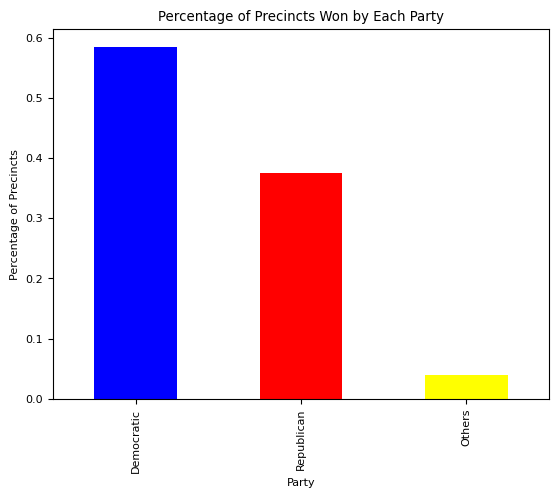

In [344]:
# do the bar plot for the winner party with percentage instead of count
prediction_data['Winner_Party'].value_counts(normalize=True).plot(kind='bar', color=['blue', 'red', 'yellow', 'green'])
plt.title('Percentage of Precincts Won by Each Party')
plt.xlabel('Party')
plt.ylabel('Percentage of Precincts')
# label the x_ticks
plt.xticks(ticks=[0, 1, 2], labels=['Democratic', 'Republican', 'Others'])
plt.show()

In [345]:
# save prediction as an object
import joblib
joblib.dump(prediction_data, 'prediction_data.pkl')

['prediction_data.pkl']

Accuracy: 0.04081632653061224


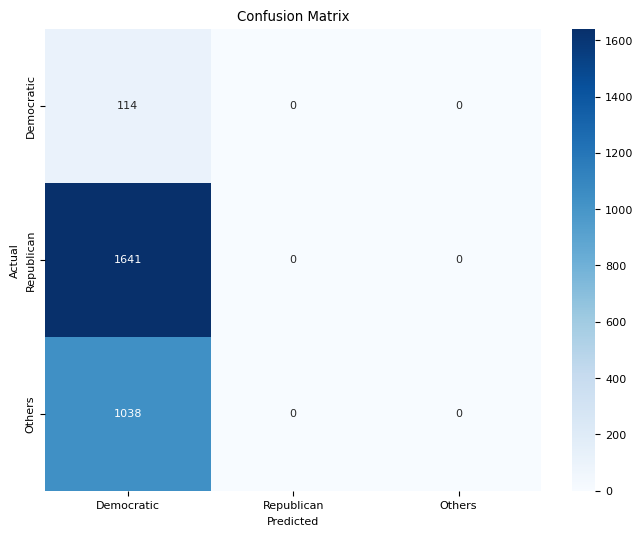

In [346]:
# fit and plot the results of predicting the winner party using logistic regression
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix
prediction_data = joblib.load('prediction_data.pkl')

# Split the data into features and target
X = prediction_data.drop(columns=['Winner_Party'], inplace=False)
y = prediction_data['Winner_Party']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize the Logistic Regression model
logreg = LogisticRegression(random_state=42)

# Fit the model on the training data
logreg.fit(X_train, y_train)

# Predict the target values
y_pred = logreg.predict(X_test)

# Calculate the accuracy of the model
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy}")

# Plot the confusion matrix
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Democratic', 'Republican', 'Others'], yticklabels=['Democratic', 'Republican', 'Others'])
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

{'Democratic': {'precision': 0.04081632653061224, 'recall': 1.0, 'f1-score': 0.0784313725490196, 'support': 114.0}, 'Republican': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 1641.0}, 'Others': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 1038.0}, 'accuracy': 0.04081632653061224, 'macro avg': {'precision': 0.013605442176870748, 'recall': 0.3333333333333333, 'f1-score': 0.026143790849673203, 'support': 2793.0}, 'weighted avg': {'precision': 0.0016659725114535609, 'recall': 0.04081632653061224, 'f1-score': 0.003201280512204882, 'support': 2793.0}}


,precision,recall,f1-score
Democratic,0.040816,1.000000,0.078431
Republican,0.000000,0.000000,0.000000
Others,0.000000,0.000000,0.000000
accuracy,0.040816,0.040816,0.040816
macro avg,0.013605,0.333333,0.026144
weighted avg,0.001666,0.040816,0.003201


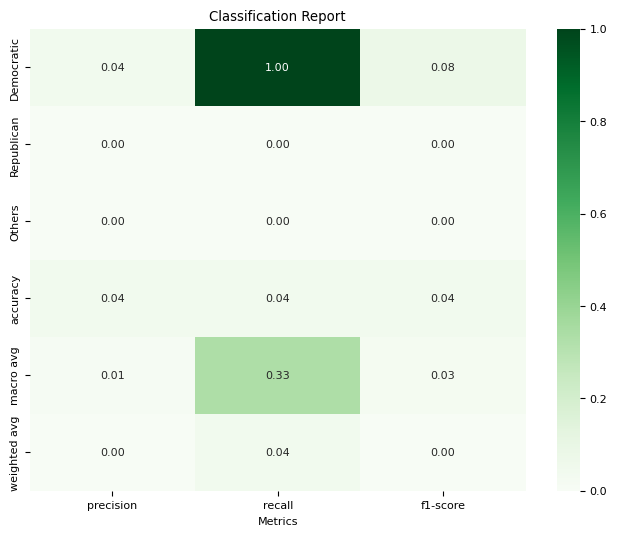

In [347]:
# create a report for the logistic regression model
from sklearn.metrics import classification_report

# Generate the classification report
report = classification_report(y_test, y_pred, target_names=['Democratic', 'Republican', 'Others'], output_dict=True)
print(report)

# class_report = classification_report(y_test, y_pred , target_names=map_polictical_party.values(), output_dict=True)
class_report_frame = pd.DataFrame(report).iloc[:-1, :].T
display(class_report_frame)
plt.figure(figsize=(8, 6))
sns.heatmap(class_report_frame, annot=True, cmap='Greens', fmt='.2f')
plt.title("Classification Report")
plt.xlabel("Metrics")
plt.show()

In [348]:
prediction_data = joblib.load('prediction_data.pkl')

In [349]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

# Split the data into features and target
X = prediction_data.drop(columns=['Winner_Party', 'GEOID', 'Total Votes'], inplace=False)
y = prediction_data['Winner_Party']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [350]:
# Initialize the Random Forest Classifier
rf_classifier = RandomForestClassifier(random_state=42)

# Fit the model on the training data
rf_classifier.fit(X_train, y_train)

RandomForestClassifier(random_state=42)

In [351]:
# save the model
# import joblib
# joblib.dump(rf_classifier, 'rf_classifier_district.pkl')

# load the model
rf_classifier = joblib.load('rf_classifier_district.pkl')

Accuracy of the Random Forest Classifier: 0.82
[[  77   30    7]
 [  13 1408  220]
 [   3  232  803]]


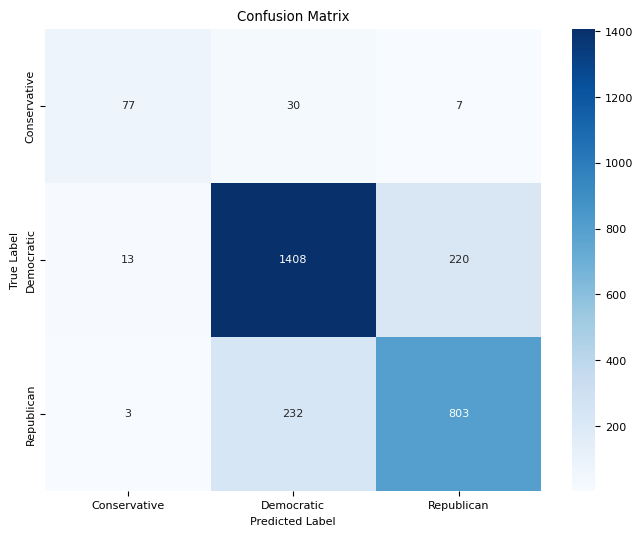

,precision,recall,f1-score
Conservative,0.827957,0.675439,0.743961
Democratic,0.843114,0.858013,0.850498
Republican,0.779612,0.773603,0.776596
accuracy,0.819191,0.819191,0.819191
macro avg,0.816894,0.769018,0.790352
weighted avg,0.818895,0.819191,0.818684


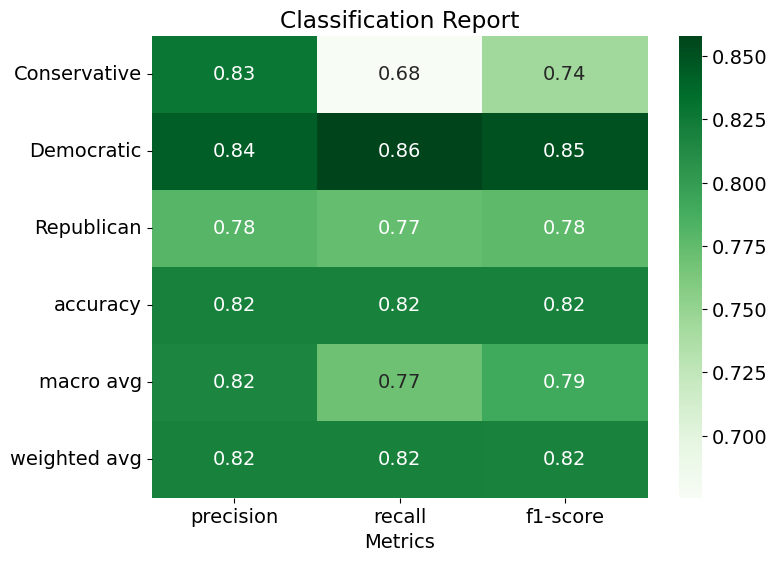

In [352]:
from sklearn.metrics import confusion_matrix, classification_report

# Predict the target values
y_pred = rf_classifier.predict(X_test)
# Calculate the accuracy of the model
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy of the Random Forest Classifier: {accuracy:.2f}")
map_polictical_party = { 0:'Conservative', 1: 'Democratic', 2: 'Republican' }

# Calculate the confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
print(conf_matrix)
# Plot the confusion matrix with annotations from map_polictical_party
# label the y axis as True Label and x axis as Predicted Label
import seaborn as sns
import matplotlib.pyplot as plt


plt.figure(figsize=(8, 6))
# increase the text size for better readability
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=map_polictical_party.values(), yticklabels=map_polictical_party.values())
plt.title("Confusion Matrix")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

# Calculate the classification report
plt.rcParams["font.size"] = 14
class_report = classification_report(y_test, y_pred , target_names=map_polictical_party.values(), output_dict=True)
class_report_frame = pd.DataFrame(class_report).iloc[:-1, :].T
display(class_report_frame)
plt.figure(figsize=(8, 6))
sns.heatmap(class_report_frame, annot=True, cmap='Greens', fmt='.2f')
plt.title("Classification Report")
plt.xlabel("Metrics")
plt.show()

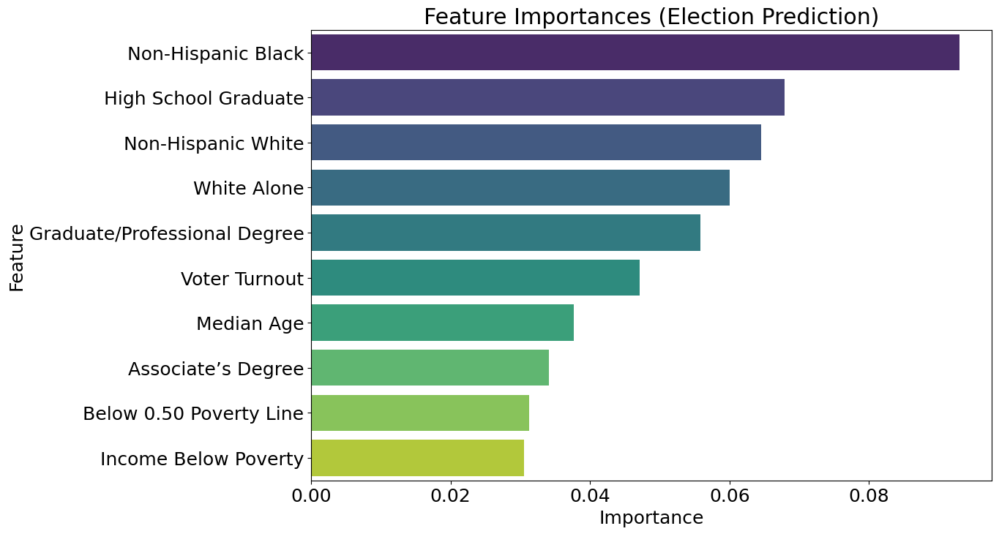

In [353]:
# Extract the feature importances
feature_importances = rf_classifier.feature_importances_

# Create a DataFrame to display the feature importances
feature_importances_df = pd.DataFrame({'Feature': X.columns, 'Importance': feature_importances})

# Sort the DataFrame by the feature importance
feature_importances_df = feature_importances_df.sort_values(by='Importance', ascending=False)

# Plot the feature importances
plt.figure(figsize=(12, 8))
plt.rcParams.update({'font.size': 18})
sns.barplot(x='Importance', y='Feature', data=feature_importances_df.head(10), palette='viridis')
plt.title('Feature Importances (Election Prediction)')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.show()

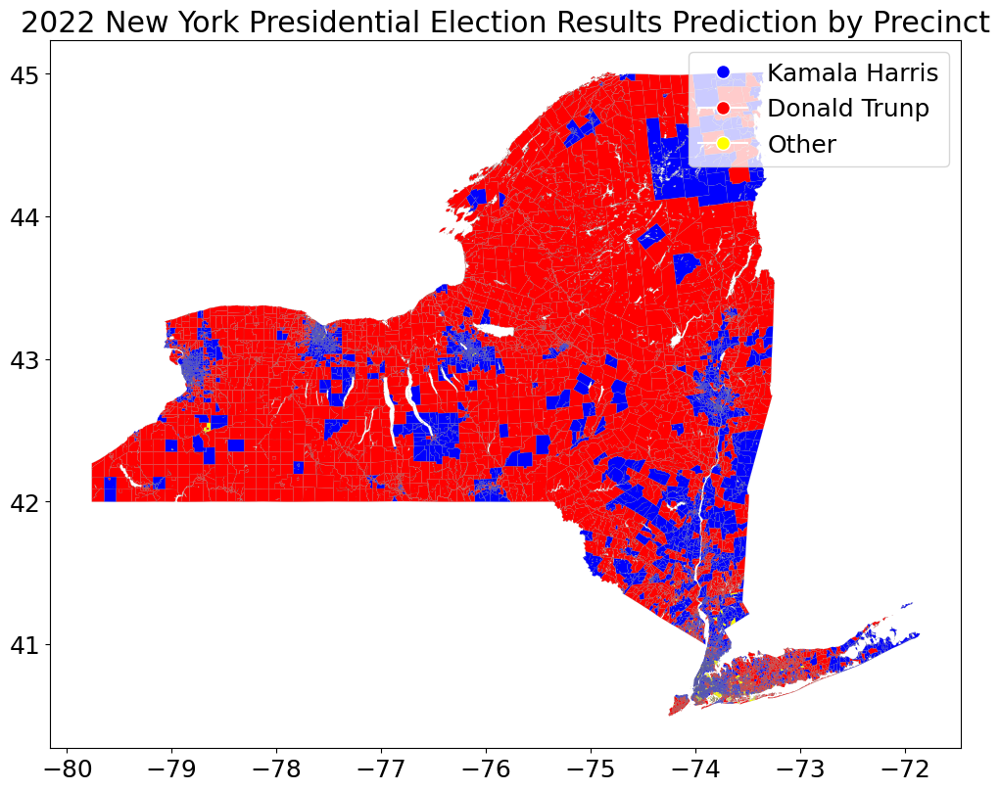

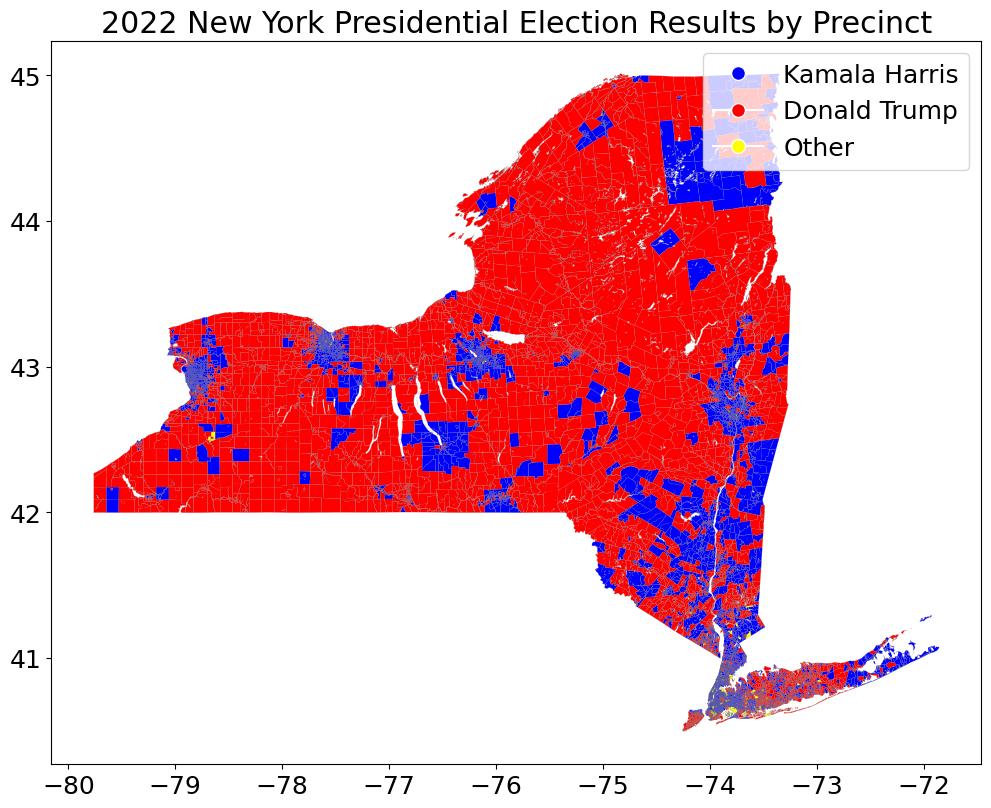

In [354]:
from matplotlib.lines import Line2D
# Plot the results of the Random Forest Classifier on the map
# Predict the target values
prediction_data['Predicted_Party'] = rf_classifier.predict(X)
map_polictical_party = { 0:'Conservative', 1: 'Democratic', 2: 'Republican' , 3: 'Working Families Party' }
prediction_data['Predicted_Party'] = prediction_data['Winner_Party'].map(map_polictical_party)

# Map the predicted party to the respective color
prediction_data['Predicted_Color'] = prediction_data['Predicted_Party'].map(party_colormap)

# Merge the prediction data with the election_merged GeoDataFrame
election_merged['Predicted_Party'] = prediction_data['Predicted_Party']
election_merged['Predicted_Color'] = prediction_data['Predicted_Color']

# Plot the map with colored precincts
fig, ax = plt.subplots(figsize=(12, 12))
plt.rcParams.update({'font.size': 18})
election_merged.plot(column='Predicted_Color', color=election_merged['Predicted_Color'], legend = True ,linewidth=0.1, ax=ax, edgecolor='0.5')
ax.set_title("2022 New York Presidential Election Results Prediction by Precinct")

legend_elements = [Line2D([0], [0], marker='o', color='w', label='Kamala Harris', markerfacecolor='blue', markersize=10),
                        Line2D([0], [0], marker='o', color='w', label='Donald Trunp', markerfacecolor='red', markersize=10),
                        Line2D([0], [0], marker='o', color='w', label='Other', markerfacecolor='yellow', markersize=10)]

ax.legend(handles=legend_elements, loc='upper right')
plt.rcParams.update({'font.size': 18})
# Plot the map with colored precincts
fig, ax = plt.subplots(figsize=(12, 12))
election_merged.plot(column='color', color=election_merged['color'], legend = True ,linewidth=0.1, ax=ax, edgecolor='0.5')
ax.set_title("2022 New York Presidential Election Results by Precinct")

legend_elements = [Line2D([0], [0], marker='o', color='w', label='Kamala Harris', markerfacecolor='blue', markersize=10),
                    Line2D([0], [0], marker='o', color='w', label='Donald Trump', markerfacecolor='red', markersize=10),
                    Line2D([0], [0], marker='o', color='w', label='Other', markerfacecolor='yellow', markersize=10)]

ax.legend(handles=legend_elements, loc='upper right')

plt.show()

In [355]:
# What percentage of the total votes did the Democratic candidate receive in the precinct with the highest voter turnout?
# Find the precinct with the highest voter turnout
precinct_highest_voter_turnout = prediction_data.loc[prediction_data['Voter Turnout'].idxmax()]
# What is the median household income in the precinct with the highest voter turnout?
# Find the precinct with the highest voter turnout
precinct_highest_voter_turnout = prediction_data.loc[prediction_data['Voter Turnout'].idxmax()]

# Calculate the median household income in the precinct
median_household_income = precinct_highest_voter_turnout['Median Household Income (Adjusted)']
print(f"The median household income in the precinct with the highest voter turnout is ${median_household_income:.2f}")

# Precinct with lowest voter turnout
precinct_lowest_voter_turnout = prediction_data.loc[prediction_data['Voter Turnout'].idxmin()]

# Calculate the median household income in the precinct
median_household_income = precinct_lowest_voter_turnout['Median Household Income (Adjusted)']
print(f"The median household income in the precinct with the lowest voter turnout is ${median_household_income:.2f}")

The median household income in the precinct with the highest voter turnout is $58272.20
The median household income in the precinct with the lowest voter turnout is $158956.30


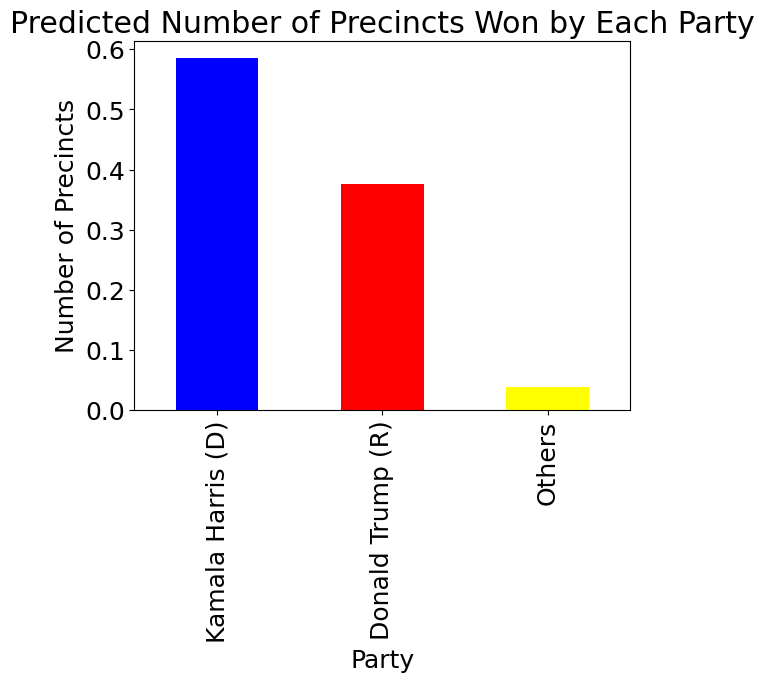

In [356]:
# bar plot of predictin winner party
# turn the party into percentage
prediction_data['Winner_Party'].value_counts(normalize=True).plot(kind='bar', color=['blue', 'red', 'yellow', 'green'])
# prediction_data['Winner_Party'].value_counts().plot(kind='bar', color=['blue', 'red', 'yellow', 'green'])
plt.title('Predicted Number of Precincts Won by Each Party')
plt.xlabel('Party')
plt.ylabel('Number of Precincts')
# label the x_ticks
plt.xticks(ticks=[0, 1, 2], labels=['Kamala Harris (D)', 'Donald Trump (R)', 'Others'])
plt.show()


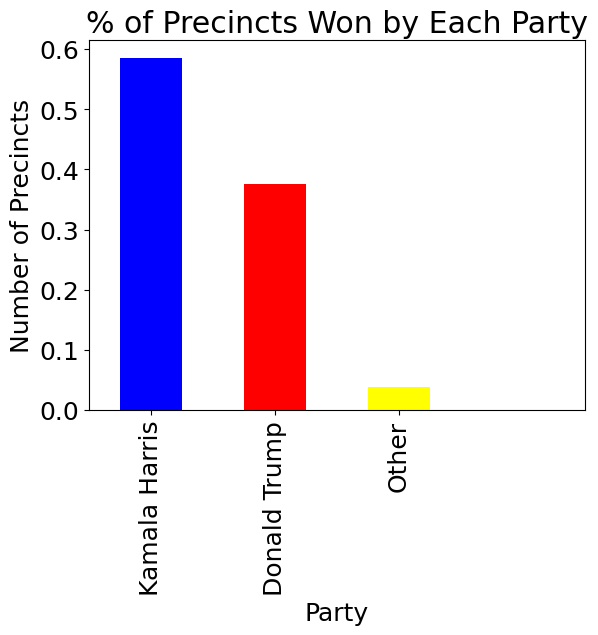

In [357]:
# go through the Winn
# bar chart of the number of precincts won by each party
(ny_parties['Winner_Party'].value_counts()/len(ny_parties)).plot(kind='bar', color=['blue', 'red', 'yellow', 'green'])
plt.xticks(ticks=[0, 1, 2], labels=['Kamala Harris', 'Donald Trump', 'Other'])
plt.title('% of Precincts Won by Each Party')
plt.xlabel('Party')
plt.ylabel('Number of Precincts')
plt.show()


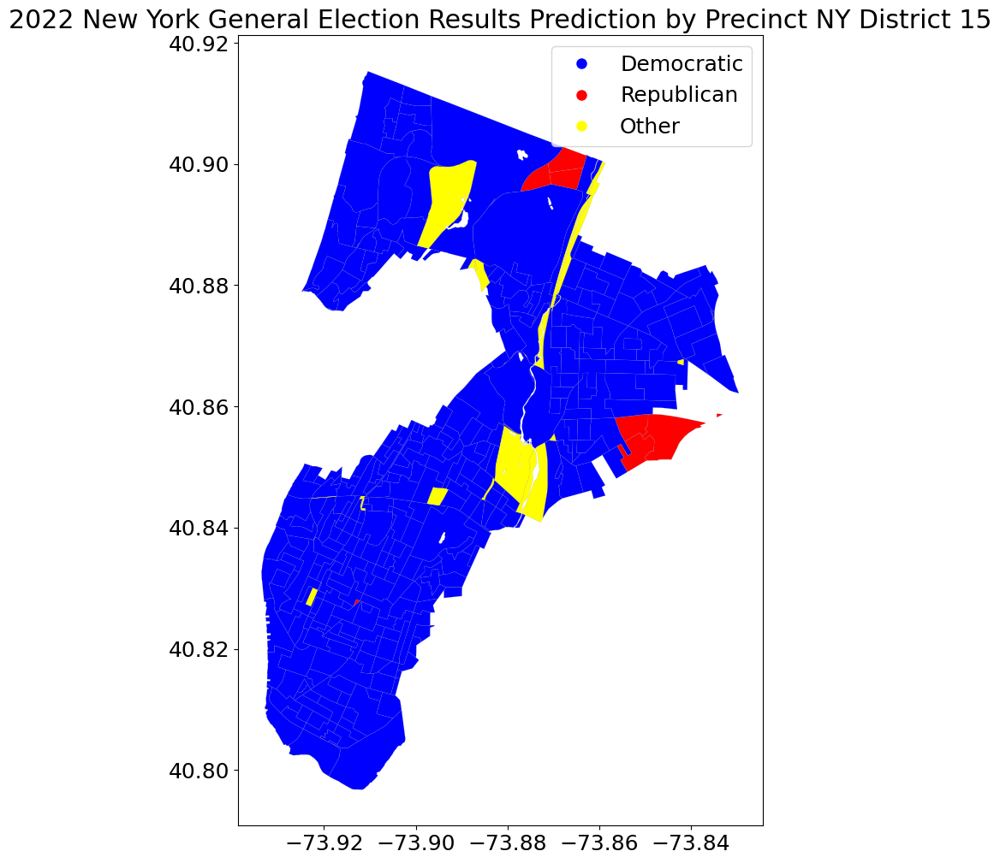

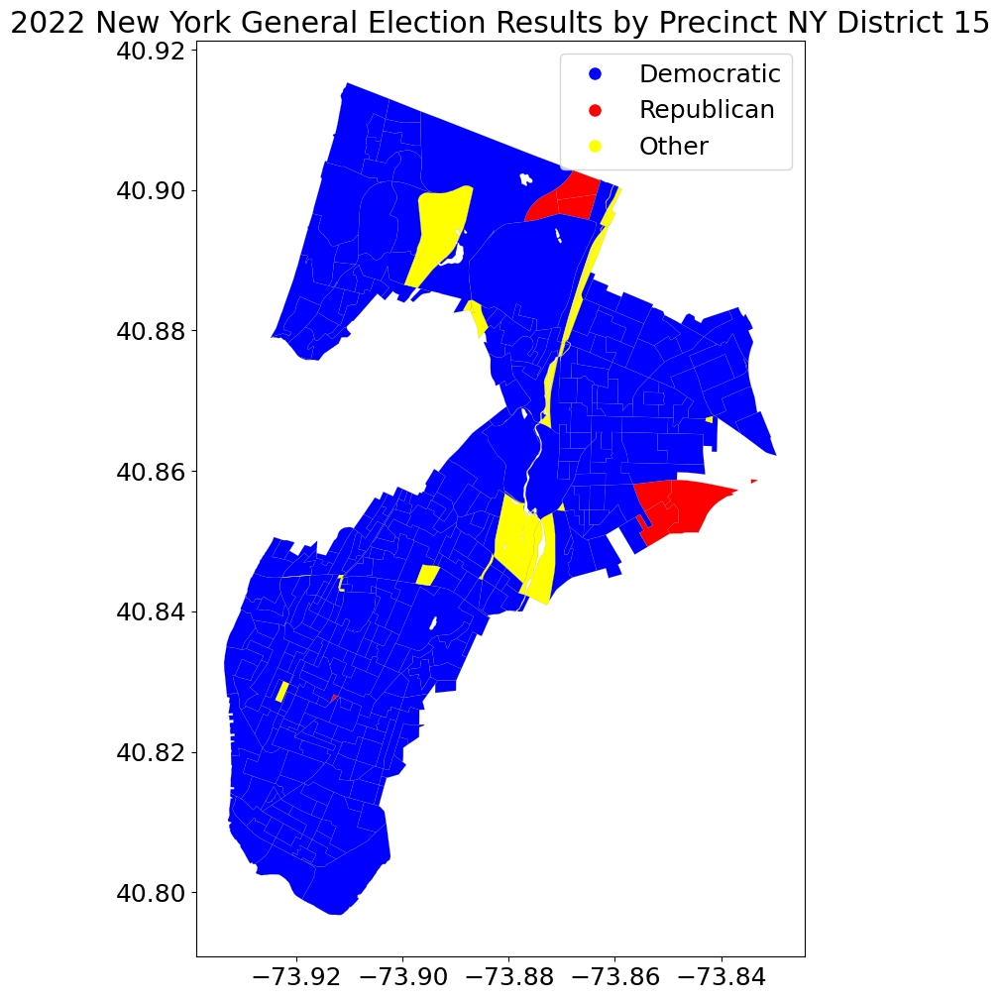

In [358]:
# plot the ny15 district map with the predicted party
# Filter the GeoDataFrame for the specified UNIQUE_IDs
filtered_gdf = election_merged[election_merged['UNIQUE_ID'].isin(cong_15_UIDs)]


# Plot the map with colored precincts
fig, ax = plt.subplots(figsize=(12, 12))
filtered_gdf.plot(column='Predicted_Color', color=filtered_gdf['Predicted_Color'], legend = True ,linewidth=0.1, ax=ax, edgecolor='0.5')
ax.set_title("2022 New York General Election Results Prediction by Precinct NY District 15")

legend_elements = [Line2D([0], [0], marker='o', color='w', label='Democratic', markerfacecolor='blue', markersize=10),
                        Line2D([0], [0], marker='o', color='w', label='Republican', markerfacecolor='red', markersize=10),
                        Line2D([0], [0], marker='o', color='w', label='Other', markerfacecolor='yellow', markersize=10)]
plt.rcParams.update({'font.size': 18})
ax.legend(handles=legend_elements, loc='upper right')

fig, ax = plt.subplots(figsize=(12, 12))
filtered_gdf.plot(column='color', color=filtered_gdf['color'], legend = True ,linewidth=0.1, ax=ax, edgecolor='0.5')
ax.set_title("2022 New York General Election Results by Precinct NY District 15")
plt.rcParams.update({'font.size': 18})
legend_elements = [Line2D([0], [0], marker='o', color='w', label='Democratic', markerfacecolor='blue', markersize=10),
                        Line2D([0], [0], marker='o', color='w', label='Republican', markerfacecolor='red', markersize=10),
                        Line2D([0], [0], marker='o', color='w', label='Other', markerfacecolor='yellow', markersize=10)]


ax.legend(handles=legend_elements, loc='upper right')
plt.show()

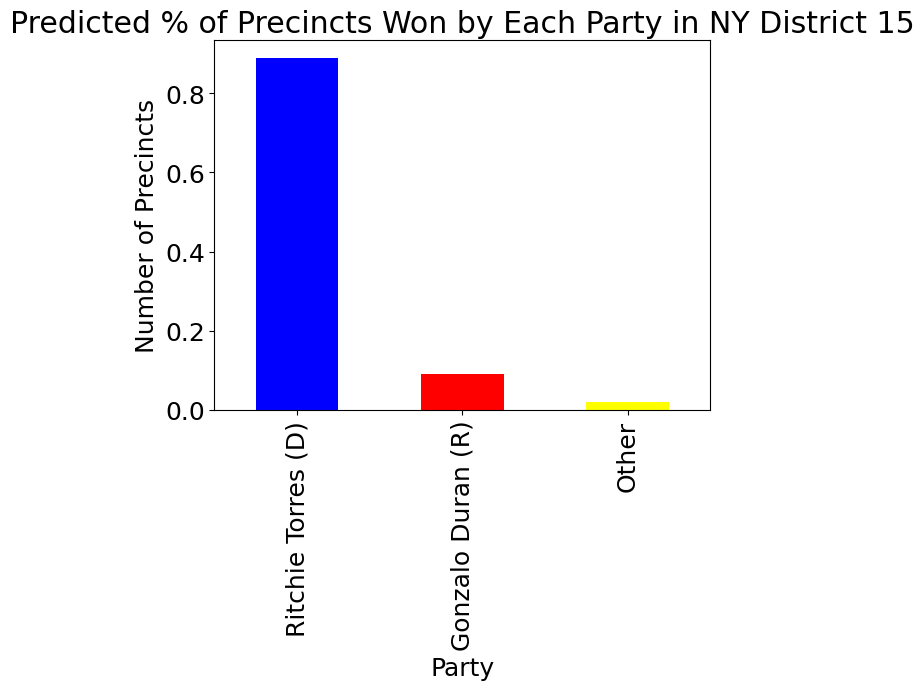

In [359]:
# plot bar chart of the number of precincts won by each party in NY15 by %%
(filtered_gdf['Predicted_Party'].value_counts()/len(filtered_gdf)).plot(kind='bar', color=['blue', 'red', 'yellow', 'green'])
plt.xticks(ticks=[0, 1, 2], labels=['Ritchie Torres (D)', 'Gonzalo Duran (R)', 'Other'])
plt.title('Predicted % of Precincts Won by Each Party in NY District 15')
plt.xlabel('Party')
plt.ylabel('Number of Precincts')
plt.show()


## Map Voter Turnout on precicnt level

In [361]:
# save prediction as an object
import joblib
prediction_data = joblib.load('prediction_data.pkl')

In [ ]:
#avergae voter turnout
prediction_data['Voter Turnout'].mean()

np.float64(0.463001255803845)

Mean Squared Error: 0.0618870063994564
Accuracy with tolerance 0.01: 0.0322234156820623
Accuracy with tolerance 0.05: 0.14930182599355532
Accuracy with tolerance 0.1: 0.2996777658431794
Accuracy with tolerance 0.15: 0.4396706050841389
Accuracy with tolerance 0.2: 0.5725026852846402


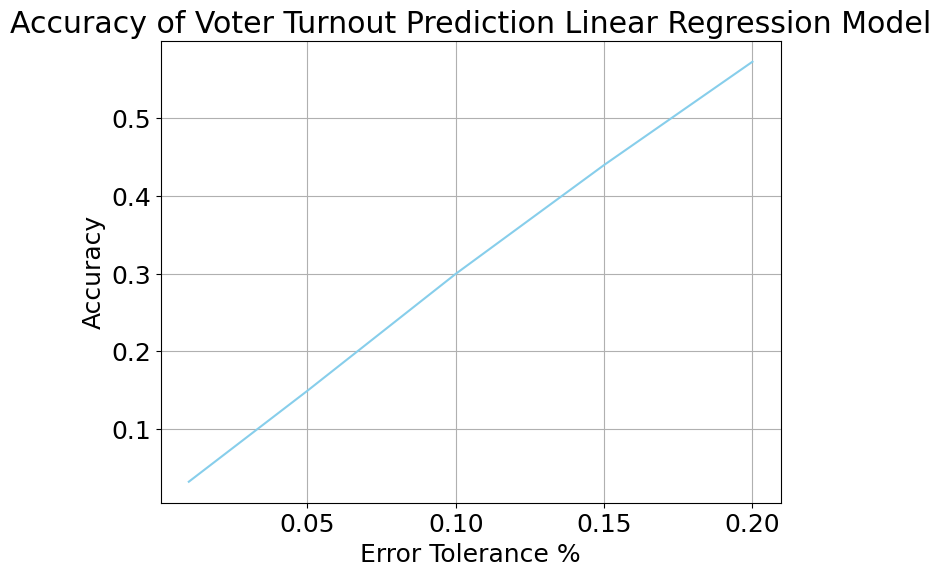

In [362]:
# do prediction for voter turnout using linear regression
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error

# Split the data into features and target
X = prediction_data.drop(columns=['Voter Turnout'], inplace=False)
y = prediction_data['Voter Turnout']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize the Linear Regression model
linreg = LinearRegression()

# Fit the model on the training data
linreg.fit(X_train, y_train)

# Predict the target values
y_pred = linreg.predict(X_test)

# Calculate the mean squared error of the model
mse = mean_squared_error(y_test, y_pred)
print(f"Mean Squared Error: {mse}")
# plot the percentage of voter turnout that the model predicted accurately
# Calculate the percentage of voter turnout that the model predicted accurately
# add some tolerance to the prediction
tol_list = [0.01, 0.05, 0.1, 0.15, 0.2]
acc_list = []
for tolerance in tol_list:
    accurate_predictions = (abs(y_test - y_pred) < tolerance).sum()
    # accuracy = (y_test == y_pred).sum() / len(y_test)
    accuracy = accurate_predictions / len(y_test)
    acc_list.append(accuracy)
    print(f"Accuracy with tolerance {tolerance}: {accuracy}")
    
plt.figure(figsize=(8, 6))
plt.plot(tol_list, acc_list, color='skyblue')
plt.title('Accuracy of Voter Turnout Prediction Linear Regression Model')
plt.xlabel('Error Tolerance %')
plt.ylabel('Accuracy')
plt.grid(True)
plt.show()

In [363]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
import seaborn as sns

X = prediction_data.drop(columns=['Voter Turnout', 'GEOID', 'Winner_Party', 'Total Votes', 'Total Population by Age and Sex'], inplace=False)
y = prediction_data['Voter Turnout']
print(X.columns)
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

Index(['Median Age', 'Median Rent as % of Income', 'Median Household Income',
       'Household Income (Adjusted)', 'Median Household Income (Adjusted)',
       'index_right', 'Total Female Population by Age',
       'Total Voting-Age Citizens', 'Voting-Age Citizens, 18-29',
       'Voting-Age Citizens, 30-44', 'Voting-Age Citizens, 45-64',
       'Voting-Age Citizens, 65+', 'Less than 9th Grade',
       '9th-12th Grade, No Diploma', 'High School Graduate',
       'Some College, No Degree', 'Associate’s Degree', 'Bachelor’s Degree',
       'Graduate/Professional Degree', 'Income Below Poverty',
       'Income Above Poverty', 'White Alone', 'Non-Hispanic White',
       'Non-Hispanic Black', 'Income to Poverty Ratio',
       'Below 0.50 Poverty Line', 'Educational Attainment, 25+',
       'Vacant Housing Units', 'Renter-Occupied Housing Units'],
      dtype='object')


In [364]:
# Initialize the Random Forest Classifier
rf_classifier_vt = RandomForestRegressor(random_state=42)

# Fit the model on the training data
rf_classifier_vt.fit(X_train, y_train)

# save the model
joblib.dump(rf_classifier_vt, 'rf_classifier_vt.pkl')

['rf_classifier_vt.pkl']

In [365]:
# load the model
rf_classifier_vt = joblib.load('rf_classifier_vt.pkl')

Mean Squared Error: 0.03
Accuracy with tolerance 0.01: 0.05692803437164339
Accuracy with tolerance 0.05: 0.24561403508771928
Accuracy with tolerance 0.1: 0.4522019334049409
Accuracy with tolerance 0.15: 0.6326530612244898
Accuracy with tolerance 0.2: 0.7568922305764411


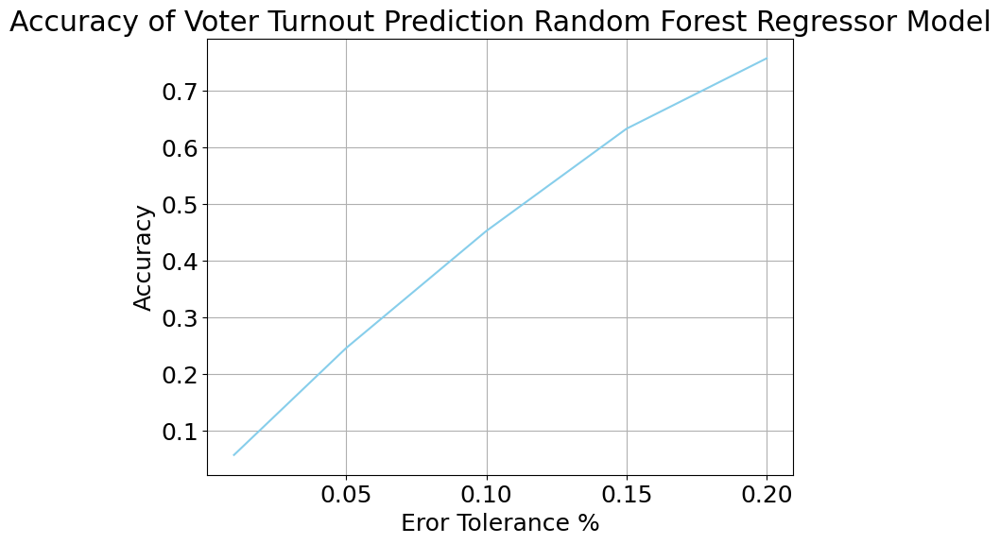

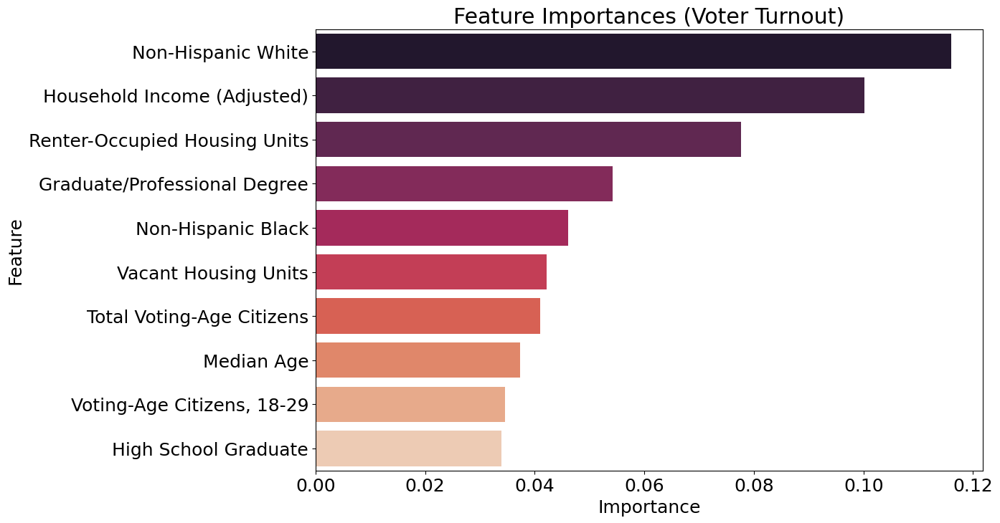

In [366]:
# Perform predictions on the test data
y_pred = rf_classifier_vt.predict(X_test)

# Calculate the mean squared error
from sklearn.metrics import mean_squared_error
mse = mean_squared_error(y_test, y_pred)
print(f"Mean Squared Error: {mse:.2f}")

# Calculate the percentage of voter turnout that the model predicted accurately
accurate_predictions = (abs(y_test - y_pred) < 0.05).sum()

tol_list = [0.01, 0.05, 0.1, 0.15, 0.2]
acc_list = []
for tolerance in tol_list:
    accurate_predictions = (abs(y_test - y_pred) < tolerance).sum()
    # accuracy = (y_test == y_pred).sum() / len(y_test)
    accuracy = accurate_predictions / len(y_test)
    acc_list.append(accuracy)
    print(f"Accuracy with tolerance {tolerance}: {accuracy}")
    
plt.figure(figsize=(8, 6))
plt.plot(tol_list, acc_list, color='skyblue')
plt.title('Accuracy of Voter Turnout Prediction Random Forest Regressor Model')
plt.xlabel('Eror Tolerance %')
plt.ylabel('Accuracy')
plt.grid(True)
plt.show()

# Extract the feature importances
feature_importances = rf_classifier_vt.feature_importances_

# Create a DataFrame to display the feature importances
feature_importances_df = pd.DataFrame({'Feature': X.columns, 'Importance': feature_importances})


# Sort the DataFrame by the feature importance
feature_importances_df = feature_importances_df.sort_values(by='Importance', ascending=False)

# Plot the feature importances
plt.figure(figsize=(12, 8))
# sns.barplot(x='Importance', y='Feature', data=feature_importances_df, palette='viridis')
# plot top 5
plt.rcParams.update({'font.size': 18})
sns.barplot(x='Importance', y='Feature', data=feature_importances_df.head(10), palette='rocket')
plt.title('Feature Importances (Voter Turnout)')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.show()

In [ ]:
# Merge precinct data with party results
election_merged = grouped_precint_block.merge(ny_parties[['UNIQUE_ID', 'Winner_Party', 'color']], on='UNIQUE_ID', how='inner')

In [ ]:
from matplotlib.lines import Line2D
# Plot the results of the Random Forest Classifier on the map
# Predict the target values
prediction_data['Predicted Voter Turnout'] =  rf_classifier_vt.predict(X)
# map_polictical_party = { 0:'Conservative', 1: 'Democratic', 2: 'Republican' , 3: 'Working Families Party' }
# prediction_data['Predicted_Party'] = prediction_data['Winner_Party'].map(map_polictical_party)

# Map the predicted party to the respective color
# prediction_data['Predicted_Color'] = prediction_data['Predicted_Party'].map(party_colormap)

# Merge the prediction data with the election_merged GeoDataFrame
election_merged['Predicted Voter Turnout'] = prediction_data['Predicted Voter Turnout'] 


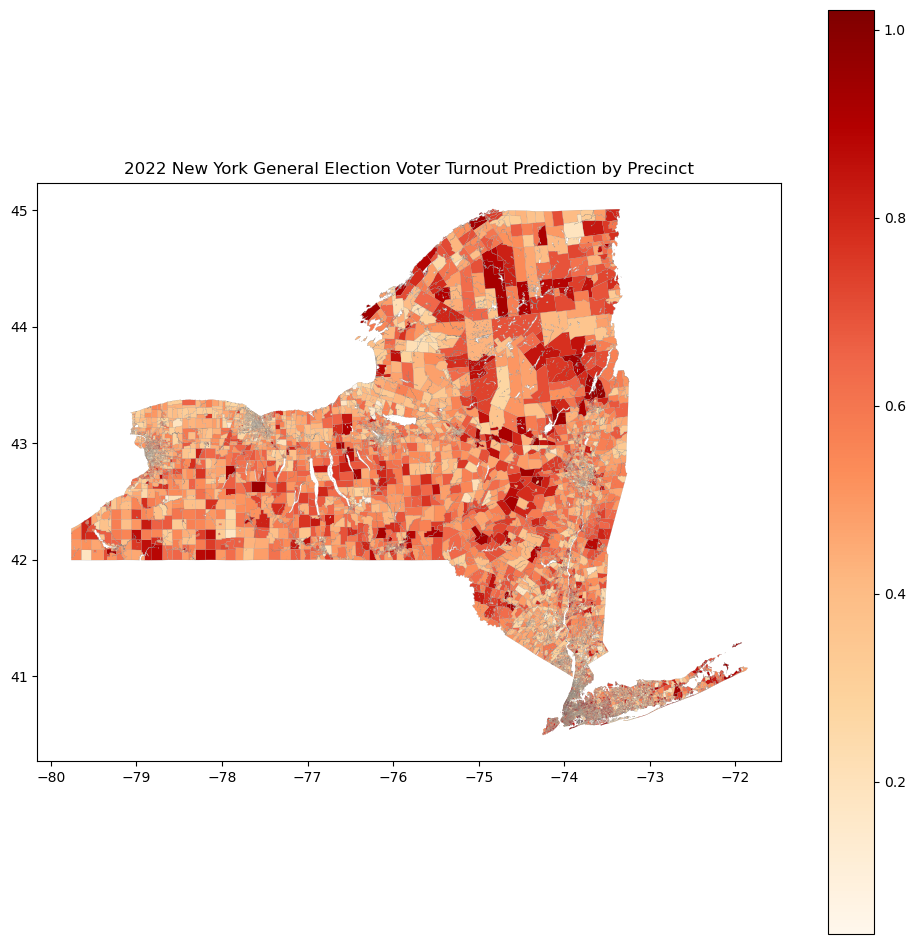

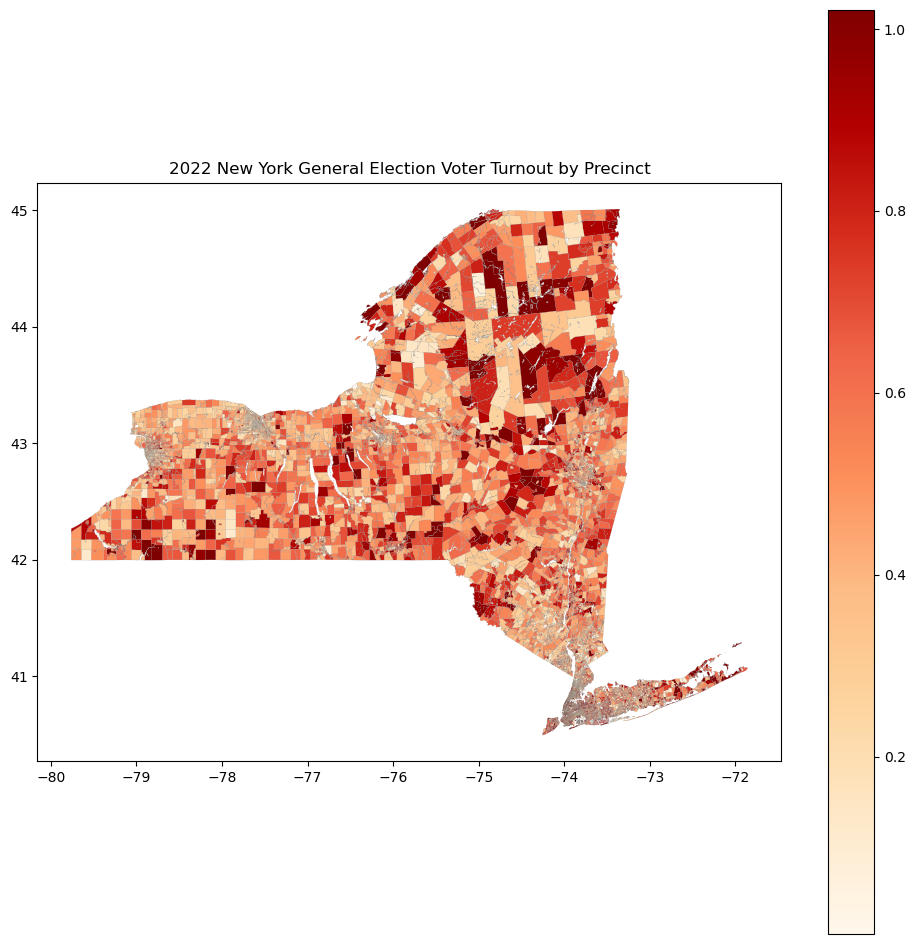

In [ ]:
# plot mapt with voter turnout for state of new york OrRd color map
fig, ax = plt.subplots(figsize=(12, 12))
election_merged.plot(column='Predicted Voter Turnout', cmap='OrRd', legend = True ,linewidth=0.1, ax=ax, edgecolor='0.5')
ax.set_title("2022 New York General Election Voter Turnout Prediction by Precinct")

fig, ax = plt.subplots(figsize=(12, 12))
election_merged.plot(column='Voter Turnout', cmap='OrRd', legend = True ,linewidth=0.1, ax=ax, edgecolor='0.5')
ax.set_title("2022 New York General Election Voter Turnout by Precinct")
plt.show()

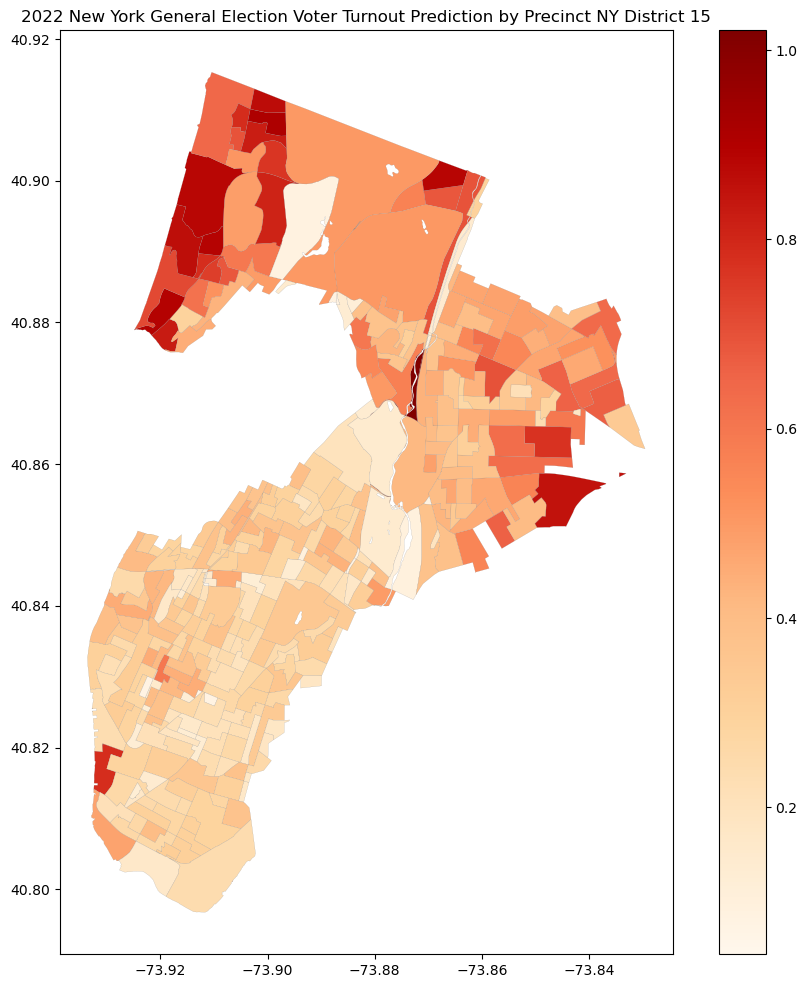

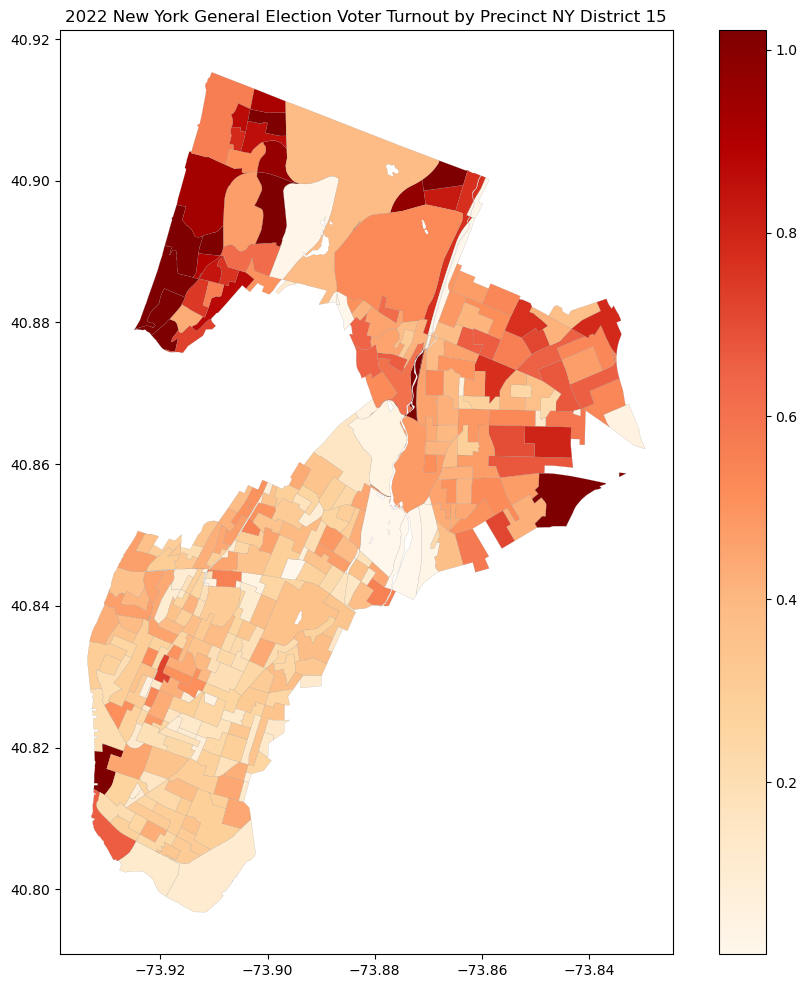

In [ ]:
# plot the ny15 district map with the predicted party
# Filter the GeoDataFrame for the specified UNIQUE_IDs
filtered_gdf = election_merged[election_merged['UNIQUE_ID'].isin(cong_15_UIDs)]


fig, ax = plt.subplots(figsize=(12, 12))
filtered_gdf.plot(column='Predicted Voter Turnout', cmap='OrRd', legend = True ,linewidth=0.1, ax=ax, edgecolor='0.5')
ax.set_title("2022 New York General Election Voter Turnout Prediction by Precinct NY District 15")
plt.show()


# Plot the map with colored precincts
fig, ax = plt.subplots(figsize=(12, 12))
filtered_gdf.plot(column='Voter Turnout', cmap='OrRd', legend = True ,linewidth=0.1, ax=ax, edgecolor='0.5')
ax.set_title("2022 New York General Election Voter Turnout by Precinct NY District 15")
plt.show()


# plot the actual voter turnout for state of new york OrRd color map

In [367]:
#avergae voter turnout
prediction_data['Voter Turnout'].mean()

np.float64(0.4767183448071604)

In [368]:
#avergae voter turnout
prediction_data['Voter Turnout'].mean()

np.float64(0.4767183448071604)

## Mapping Election data for NY15 (Legacy)

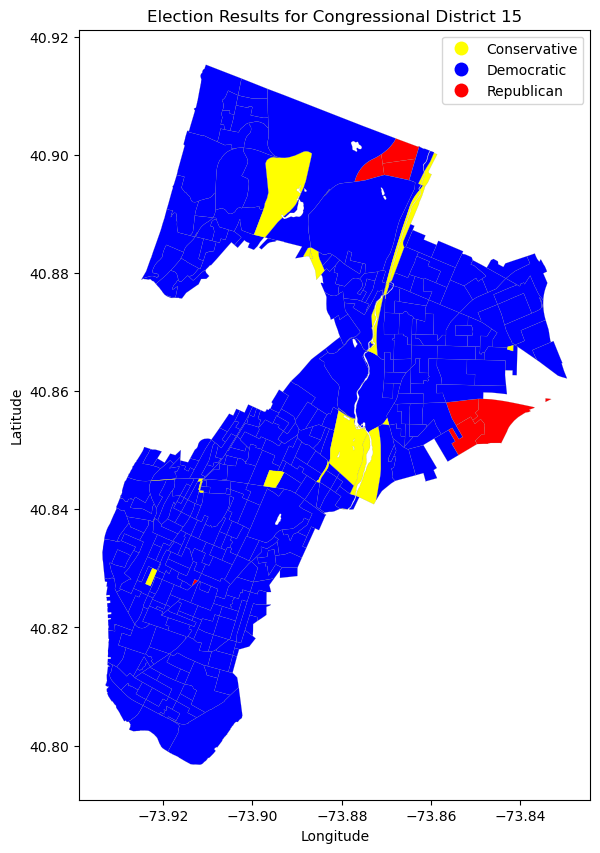

In [ ]:
from matplotlib.colors import ListedColormap
# Filter the GeoDataFrame for the specified UNIQUE_IDs
filtered_election_data = election_merged[election_merged['UNIQUE_ID'].isin(cong_15_UIDs)]
ny_parties_filtered = ny_parties[ny_parties['UNIQUE_ID'].isin(cong_15_UIDs)]

custom_colors = ['#FFFF00', '#0000FF', '#FF0000']
custom_cmap = ListedColormap(custom_colors)
# Plot the filtered GeoDataFrame
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
filtered_election_data.plot(column='Winner_Party', ax=ax, legend=True, cmap=custom_cmap , linewidth=0.1, edgecolor='0.5')
# filtered_election_data.plot(column='color', color=filtered_election_data['color'], legend = True ,linewidth=0.1, ax=ax, edgecolor='0.5')
ax.set_title('Election Results for Congressional District 15')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

plt.show()

In [ ]:
filtered_election_data['Winner_Party'].value_counts()

Winner_Party
Democratic      319
Conservative     33
Republican        7
Name: count, dtype: int64

<Axes: xlabel='Winner_Party'>

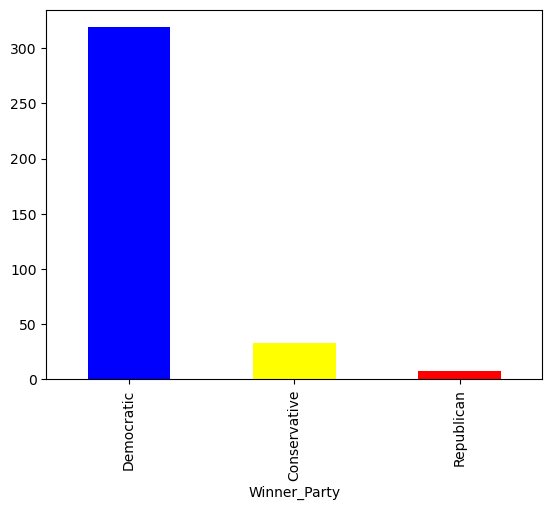

In [ ]:
filtered_election_data['Winner_Party'].value_counts().plot(kind='bar', color=['blue', 'yellow', 'red'])

In [ ]:
columns_to_drop = [col for col in election_merged.columns if col.startswith('GCON') or col in ['color', 'UNIQUE_ID', 'geometry']]
prediction_data = election_merged.drop(columns=columns_to_drop, inplace=False)
prediction_data.columns

Index(['Median Age', 'Median Rent as % of Income', 'Median Household Income',
       'Household Income (Adjusted)', 'Median Household Income (Adjusted)',
       'index_right', 'GEOID', 'Total Population by Age and Sex',
       'Total Female Population by Age', 'Total Voting-Age Citizens',
       'Voting-Age Citizens, 18-29', 'Voting-Age Citizens, 30-44',
       'Voting-Age Citizens, 45-64', 'Voting-Age Citizens, 65+',
       'Less than 9th Grade', '9th-12th Grade, No Diploma',
       'High School Graduate', 'Some College, No Degree', 'Associate’s Degree',
       'Bachelor’s Degree', 'Graduate/Professional Degree',
       'Income Below Poverty', 'Income Above Poverty', 'White Alone',
       'Non-Hispanic White', 'Non-Hispanic Black', 'Income to Poverty Ratio',
       'Below 0.50 Poverty Line', 'Educational Attainment, 25+',
       'Vacant Housing Units', 'Renter-Occupied Housing Units', 'Total Votes',
       'Voter Turnout', 'Winner_Party'],
      dtype='object')

In [ ]:
prediction_data['Winner_Party'].head()

0    Democratic
1    Democratic
2    Democratic
3    Democratic
4    Democratic
Name: Winner_Party, dtype: object

In [ ]:
prediction_data['Winner_Party'].unique()

array(['Democratic', 'Conservative', 'Republican',
       'Working Families Party'], dtype=object)

In [ ]:
number_of_classes = len(prediction_data['Winner_Party'].unique())

prediction_data['Winner_Party'] = prediction_data['Winner_Party'].map({'Democratic': 1, 'Republican': 2, 'Conservative': 0, 'Working Families Party': 0})

In [ ]:
prediction_data.drop(columns=['GEOID'], inplace=True)

In [ ]:
prediction_data.head()

,Median Age,Median Rent as % of Income,Median Household Income,Household Income (Adjusted),Median Household Income (Adjusted),index_right,Total Population by Age and Sex,Total Female Population by Age,Total Voting-Age Citizens,"Voting-Age Citizens, 18-29",...,Non-Hispanic White,Non-Hispanic Black,Income to Poverty Ratio,Below 0.50 Poverty Line,"Educational Attainment, 25+",Vacant Housing Units,Renter-Occupied Housing Units,Total Votes,Voter Turnout,Winner_Party
0,43.140000,32.664415,93671.8,519.200000,93796.800000,49431,6046,3342,4502,864,...,4262,531,6025,290,4062,248,9.159985,348.0,0.077299,1
1,37.100000,27.333333,52655.0,388.666667,52319.000000,31343,2615,1223,1976,402,...,519,1291,2556,474,1786,455,6.470000,100.0,0.050607,1
2,39.266667,31.153680,91377.0,532.500000,91267.500000,63830,7572,4054,5451,1336,...,4102,1535,7543,254,4948,308,11.320000,1302.0,0.238855,1
3,37.433333,28.460173,82672.0,416.833333,88428.303551,60363,5696,3062,3643,639,...,2841,779,5675,256,3743,248,11.210000,1613.0,0.442767,1
4,32.580000,22.420000,65431.8,411.400000,72212.764262,45513,5252,2714,3401,912,...,1794,1175,5173,262,3275,410,10.220000,1232.0,0.362246,1


In [ ]:
# Save predictions 

Accuracy: 0.8431793770139635


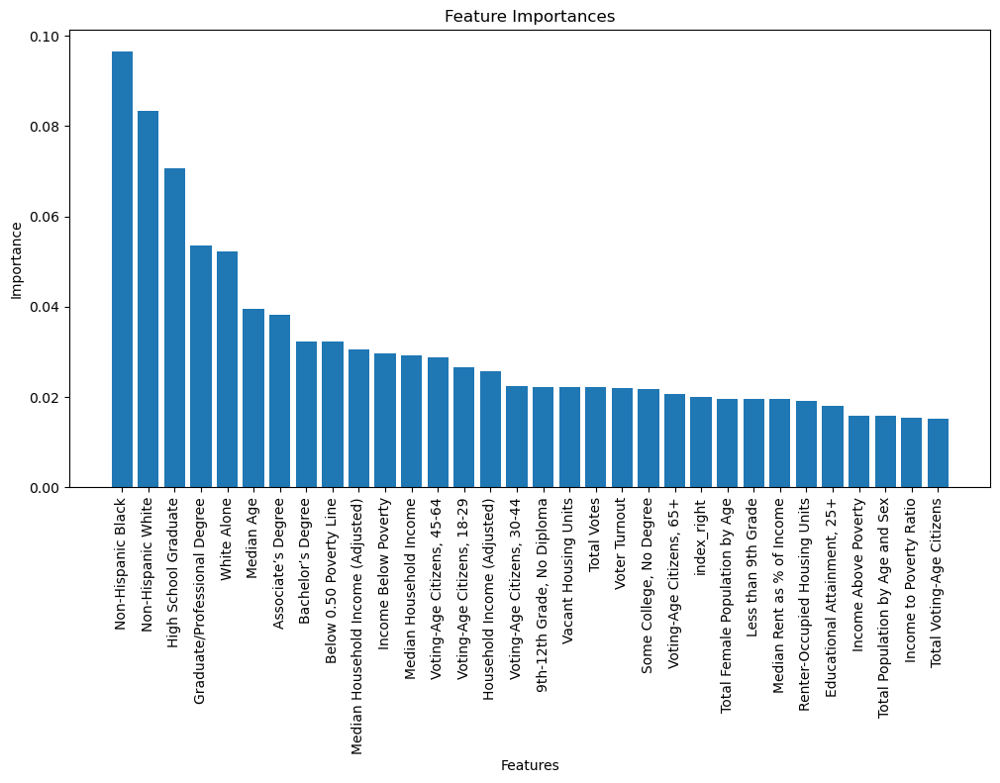

Accuracy (Top 10 Features): 0.8281417830290011
Accuracy (Top 5 Features): 0.7858933046902972


In [ ]:
# normalize the data
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
prediction_data_scaled = scaler.fit_transform(prediction_data)

# Split the data into features and target
X = prediction_data_scaled[:, :-1]
y = prediction_data_scaled[:, -1]

# Convert the target variable to categorical values
y = (y > 0).astype(int)  # Example: Convert to binary classification

# Split the data into training and testing sets
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train a Random Forest Classifier
from sklearn.ensemble import RandomForestClassifier

rf_classifier = RandomForestClassifier(random_state=42)
rf_classifier.fit(X_train, y_train)

# Make predictions
y_pred = rf_classifier.predict(X_test)

# Evaluate the model
from sklearn.metrics import accuracy_score

accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy}")

# Plot the feature importances
importances = rf_classifier.feature_importances_
indices = np.argsort(importances)[::-1]

plt.figure(figsize=(12, 6))
plt.bar(range(X_train.shape[1]), importances[indices], align='center')
plt.xticks(range(X_train.shape[1]), prediction_data.columns[:-1][indices], rotation=90)
plt.title('Feature Importances')
plt.xlabel('Features')
plt.ylabel('Importance')
plt.show()

# Train a Random Forest Classifier with the top 10 features
X_train_top = X_train[:, indices[:10]]
X_test_top = X_test[:, indices[:10]]

rf_classifier_top = RandomForestClassifier(random_state=42)
rf_classifier_top.fit(X_train_top, y_train)

# Make predictions
y_pred_top = rf_classifier_top.predict(X_test_top)

# Evaluate the model
accuracy_top = accuracy_score(y_test, y_pred_top)
print(f"Accuracy (Top 10 Features): {accuracy_top}")

# Train a Random Forest Classifier with the top 5 features
X_train_top = X_train[:, indices[:5]]
X_test_top = X_test[:, indices[:5]]

rf_classifier_top = RandomForestClassifier(random_state=42)
rf_classifier_top.fit(X_train_top, y_train)

# Make predictions
y_pred_top = rf_classifier_top.predict(X_test_top)

# Evaluate the model
accuracy_top = accuracy_score(y_test, y_pred_top)
print(f"Accuracy (Top 5 Features): {accuracy_top}")